# imports

In [22]:
import sys
sys.path.append('./lib')

import os
import h5py
import optuna

# setup paths
iteration = 1 # which version of this tutorial to run (in case want results in different dirs)
NBname = 'color_cloud_initial{}'.format(iteration)

myhost = os.uname()[1] # get name of machine
print("Running on Computer: [%s]" %myhost)

datadir = '/home/dbutts/ColorV1/Data/'
dirname = '/home/dbutts/ColorV1/CLRworkspace/' # Working directory 

import numpy as np
import torch
import pickle
import os
import optuna
from time import time
import scipy.io as sio
import matplotlib.pyplot as plt
import scipy.io as sio
import matplotlib
from copy import deepcopy

# plotting
import matplotlib.pyplot as plt

# Import torch
import torch
from torch import nn

# NDN tools
import NDNT.utils as utils # some other utilities
import NDNT.NDNT as NDN
from NDNT.modules.layers import NDNLayer, ConvLayer, STconvLayer, Tlayer, ChannelLayer, IterSTlayer, ReadoutLayer
from NDNT.networks import FFnetwork
from time import time
import dill
import tqdm

from NTdatasets.generic import GenericDataset
import NTdatasets.conway.cloud_datasets as datasets

# Utilities
import ColorDataUtils.ConwayUtils as CU
import ColorDataUtils.EyeTrackingUtils as ETutils
import ColorDataUtils.mattplotlib
import ColorDataUtils.RFutils as RFutils
from NDNT.utils import imagesc   # because I'm lazy
from NDNT.utils import ss        # because I'm real lazy

device = torch.device("cuda:1")
dtype = torch.float32

# Where saved models and checkpoints go -- this is to be automated
print( 'Save_dir =', dirname)
print(device)
%load_ext autoreload
%autoreload 2

torch.cuda.empty_cache()

class Model:
    def __init__(self, ndn_model, LLs):
        self.ndn = ndn_model
        self.LLs = LLs

Running on Computer: [ca1]
Save_dir = /home/dbutts/ColorV1/CLRworkspace/
cuda:1
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# load data

In [2]:
fn = 'Jocamo_220715_full_CC_ETCC_nofix_v08'
num_lags=16

t0 = time()
data = datasets.ColorClouds(
    datadir=datadir, filenames=[fn], eye_config=3, drift_interval=16,
    luminance_only=True, binocular=False, include_MUs=True, num_lags=num_lags,
    trial_sample=True)
t1 = time()
print(t1-t0, 'sec elapsed')

NT = data.robs.shape[0]
NA = data.Xdrift.shape[1]
print("%d (%d valid) time points"%(NT, len(data)))
#data.valid_inds = np.arange(NT, dtype=np.int64)

lam_units = np.where(data.channel_map < 32)[0]
ETunits = np.where(data.channel_map >= 32)[0]
UTunits = np.where(data.channel_map >= 32+127)[0]

print( "%d laminar units, %d ET units"%(len(lam_units), len(ETunits)))

# Replace DFs
matdat = sio.loadmat(datadir+'Jocamo_220715_full_CC_ETCC_nofix_v08_DFextra.mat')
data.dfs = torch.tensor( matdat['XDF'][:NT, :], dtype=torch.float32 )

# Pull correct saccades
matdat = sio.loadmat( datadir+'Jocamo_220715_full_CC_ETCC_v08_ETupdate.mat')
sac_ts_all = matdat['ALLsac_bins'][0, :]

data.process_fixations( sac_ts_all )
sac_tsB = matdat['sac_binsB'][0, :]
sac_tsL = matdat['sac_binsL'][0, :]
sac_tsR = matdat['sac_binsR'][0, :]

NFIX = torch.max(data.fix_n).detach().numpy()
print(NFIX, 'fixations')
et1kHzB = matdat['et1kHzB']
et60B = matdat['et60HzB']
et60all = matdat['et60Hz_all']

Reducing stimulus channels (3) to first dimension
Loading data into memory...
Adjusting stimulus read from disk: mean | std = -0.000 | 0.269
T-range: 0 167520
  Trimming experiment 365280->167520 time points based on eye_config and Tmax
115.16583371162415 sec elapsed
167520 (167520 valid) time points
29 laminar units, 210 ET units
  Redoing fix_n with saccade inputs: 6827 saccades
3795 fixations


In [3]:
# Set cells-to-analyze and pull best model configuration and mus
Reff = torch.mul(data.robs[:, UTunits], data.dfs[:, UTunits]).numpy()
nspks = np.sum(Reff, axis=0)
a = np.where(nspks > 10)[0]
valET = UTunits[a]
NCv = len(valET)
print("%d out of %d units used"%(len(valET), len(UTunits)))

## CONVERT LLsNULL, which is based on 

# Read in previous data
dirname2 = dirname+'0715/et/'
matdat = sio.loadmat(dirname2+'LLsGLM.mat')
Dreg = matdat['Dreg']
top_corner = matdat['top_corner'][:, 0]

data.set_cells(valET)

174 out of 195 units used
Output set to 174 cells


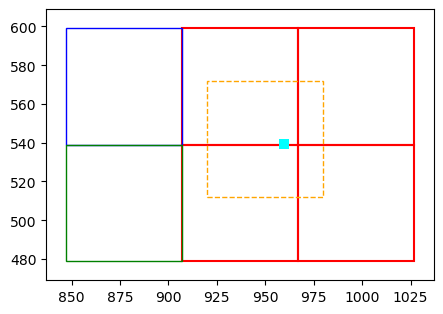

  Stim expansion for shift: [900, 492, 1000, 592]
  Writing lam stim 0: overlap 60, 47
  Writing lam stim 1: overlap 60, 53
  Writing lam stim 2: overlap 33, 53
  Writing lam stim 3: overlap 33, 47
  Writing ETstim 0: overlap 7, 53
  Writing ETstim 1: overlap 7, 47
  Adding fixation point
  Shifting stim...
  CROP: New stim size: 60 x 60
  Done


In [4]:
# Load shifts and previous models
dirname2 = dirname+'0715/et/'
SHfile = sio.loadmat( dirname2 + 'BDshifts1.mat' )
fix_n = SHfile['fix_n']
shifts = SHfile['shifts']
metricsLL = SHfile['metricsLL']
metricsTH = SHfile['metricsTH']
ETshifts = SHfile['ETshifts']
ETmetrics = SHfile['ETmetrics']
Ukeeps = SHfile['Ctrain']
XVkeeps = SHfile['Cval']

# Make 60x60 STAs (and GLMs)
Xshift = 14 #8+4 
Yshift = -3 #-10+4
NX = 60

new_tc = np.array([top_corner[0]-Xshift, top_corner[1]-Yshift], dtype=np.int64)
data.draw_stim_locations(top_corner = new_tc, L=NX)

data.assemble_stimulus(top_corner=[new_tc[0], new_tc[1]], L=NX, fixdot=0, shifts=-shifts, num_lags=num_lags)

In [5]:
goodfix = np.where(ETmetrics[:,1] < 0.80)[0]
valfix = torch.zeros([ETmetrics.shape[0], 1], dtype=torch.float32)
valfix[goodfix] = 1.0
# Test base-level performance (full DFs and then modify DFs)
#DFsave = deepcopy(data2.dfs)  # this is also in data.dfs
data.dfs_out *= valfix
("%0.1f%% fixations remaining"%(100*len(goodfix)/ETmetrics.shape[0]))
dirname2 = dirname+'0715/NewGLMs/'
matdat = sio.loadmat(dirname2+'J0715ProcGLMinfo.mat')

data.dfs.shape

torch.Size([167520, 239])

# load GQMs

In [6]:
folder = 'dan_gqms'
gqms = []
for i, cc in enumerate(range(NCv)):
    if i < 10:
        gqm_model_filename = 'models/'+folder+'/gqmU00'+str(cc)+'.pkl'
    elif i < 100:
        gqm_model_filename = 'models/'+folder+'/gqmU0'+str(cc)+'.pkl'
    else:
        gqm_model_filename = 'models/'+folder+'/gqmU'+str(cc)+'.pkl'
    if os.path.isfile(gqm_model_filename):
        # load the model and continue
        print('loading model', cc)
        with open(gqm_model_filename, 'rb') as f:
            gqm = pickle.load(f)
            gqms.append(gqm)

loading model 0
loading model 1
loading model 2
loading model 3
loading model 4
loading model 5
loading model 6
loading model 7
loading model 8
loading model 9
loading model 10
loading model 11
loading model 12
loading model 13
loading model 14
loading model 15
loading model 16
loading model 17
loading model 18
loading model 19
loading model 20
loading model 21
loading model 22
loading model 23
loading model 24
loading model 25
loading model 26
loading model 27
loading model 28
loading model 29
loading model 30
loading model 31
loading model 32
loading model 33
loading model 34
loading model 35
loading model 36
loading model 37
loading model 38
loading model 39
loading model 40
loading model 41
loading model 42
loading model 43
loading model 44
loading model 45
loading model 46
loading model 47
loading model 48
loading model 49
loading model 50
loading model 51
loading model 52
loading model 53
loading model 54
loading model 55
loading model 56
loading model 57
loading model 58
loading

In [83]:
# load LLS
LLinfo = None
with open('models/dan_gqms/LLinfo.mat', 'rb') as f:
    LLinfo = sio.loadmat(f)

LLinfo['ULLsNULL'].shape

(1, 174)

In [88]:
# calculate the LL for each model
LLs = []
for cc, gqm in enumerate(tqdm.tqdm(gqms)):
    LL = LLinfo['ULLsNULL'][0,cc] - gqm.eval_models(data[data.val_blks])[0]
    LLs.append(LL)

with open('models/dan_gqms/LLs.pkl', 'wb') as f:
    pickle.dump(LLs, f)

with open('models/dan_gqms/LLs.pkl', 'rb') as f:
    LLs = pickle.load(f)

100%|███████████████████████████████████████████████████████████████████████████████████████| 174/174 [04:22<00:00,  1.51s/it]


# complex and dir score

In [103]:
complex_scores = []
direction_scores = []
direction_angles = []
direction_ims = []
for cc in tqdm.tqdm(range(len(gqms))):
    complex_score, _,_ = RFutils.GQM_complexity(gqms[cc], data, valET[cc], 0,2)
    dir_score, dir_angle, dir_im = RFutils.GQM_direction(gqms[cc], 0,2)
    complex_scores.append(complex_score)
    direction_scores.append(dir_score)
    direction_angles.append(dir_angle)
    direction_ims.append(dir_im)
complex_scores = np.array(complex_scores)
direction_scores = np.array(direction_scores)
direction_angles = np.array(direction_angles)

  1%|▌                                                                                        | 1/174 [00:01<04:31,  1.57s/it]/home/mattjac/projects/mattjac/v1/ColorDataUtils/RFutils.py:211: RuntimeWarning: divide by zero encountered in scalar divide
  # convert to degrees
100%|███████████████████████████████████████████████████████████████████████████████████████| 174/174 [04:30<00:00,  1.55s/it]


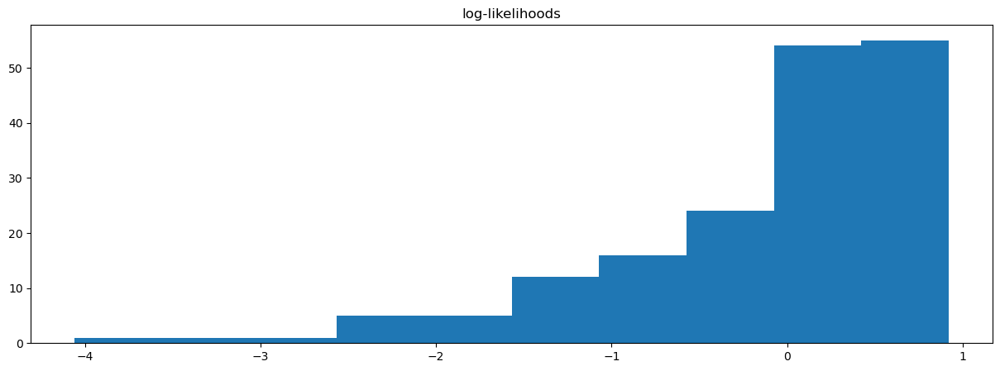

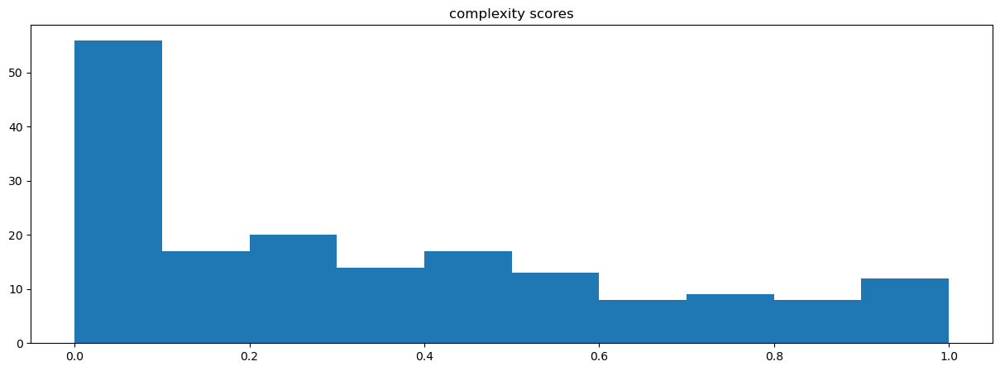

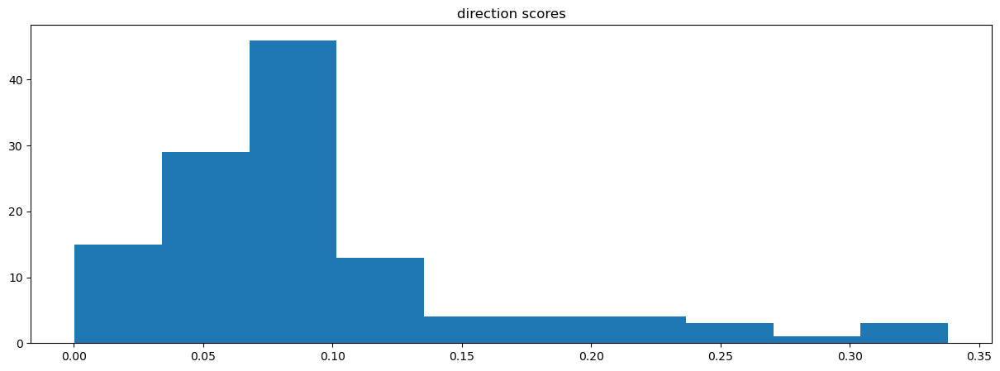

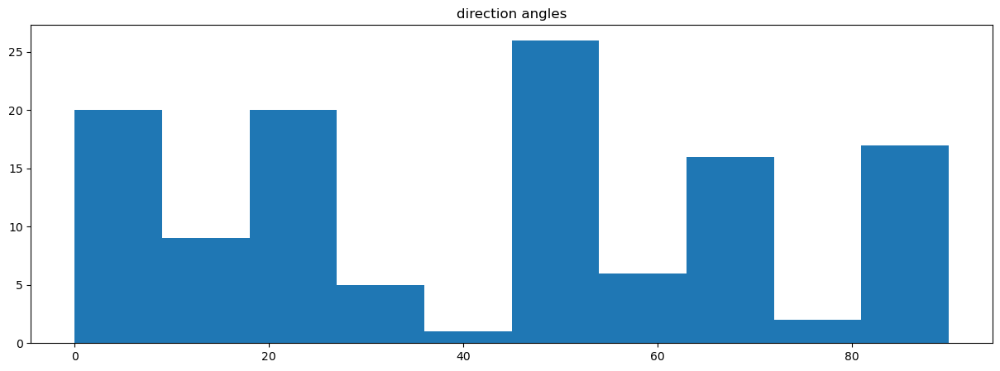

In [104]:
# plot histogram of LLs
fig = plt.figure(figsize=(15,5))
plt.hist(LLs, bins=10)
plt.title('log-likelihoods')
plt.show()

# plot histogram of complex scores
fig = plt.figure(figsize=(15,5))
plt.hist(complex_scores, bins=10)
plt.title('complexity scores')
plt.show()

# plot histogram of direction scores
fig = plt.figure(figsize=(15,5))
plt.hist(direction_scores[direction_scores >= 0], bins=10)
plt.title('direction scores')
plt.show()

# plot histogram of direction scores
fig = plt.figure(figsize=(15,5))
plt.hist(direction_angles[direction_angles >= 0], bins=10)
plt.title('direction angles')
plt.show()

In [100]:
np.where(direction_scores < 0)[0].shape

(52,)

complexity: 0.069 | LL: -0.114 | direction: 0.0 | angle: 90°


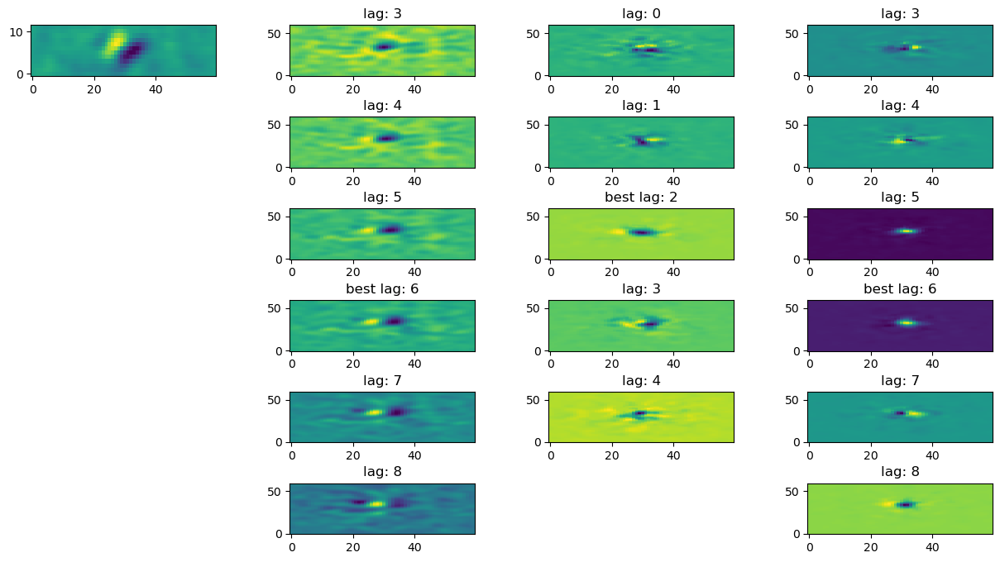

complexity: 0.023 | LL: 0.266 | direction: 0.004 | angle: 18°


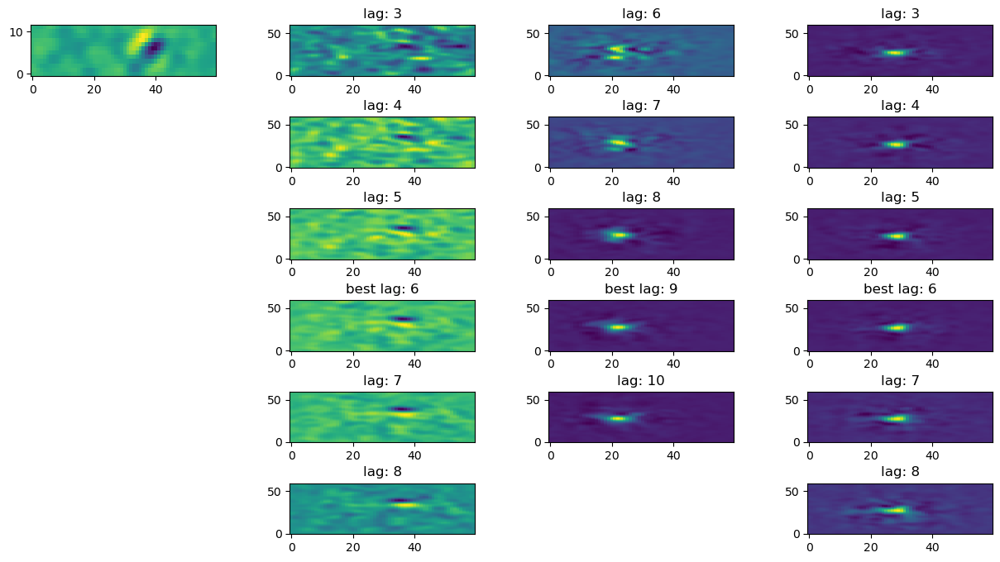

complexity: 0.186 | LL: 0.401 | direction: 0.007 | angle: 63°


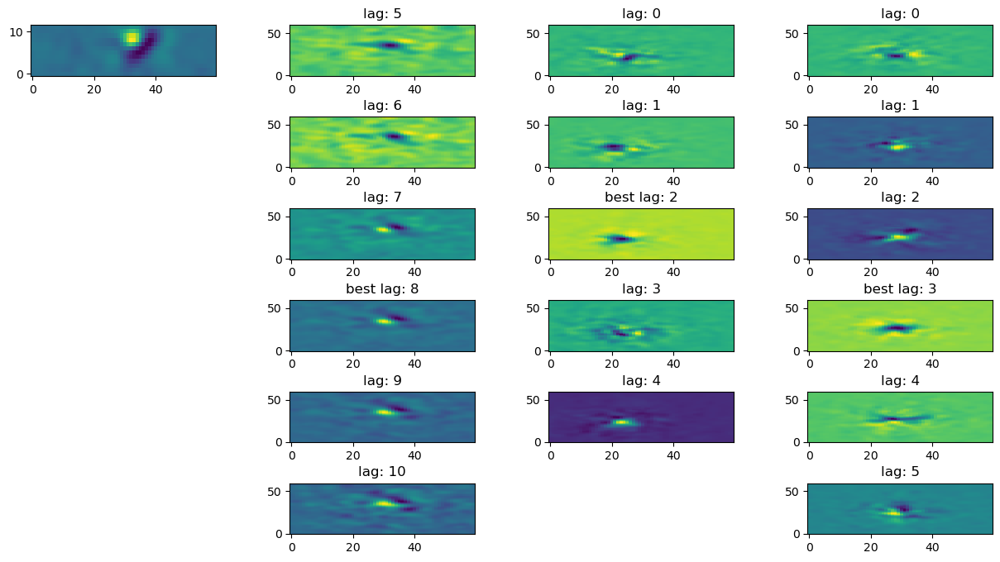

complexity: 0.593 | LL: 0.34 | direction: 0.008 | angle: 0°


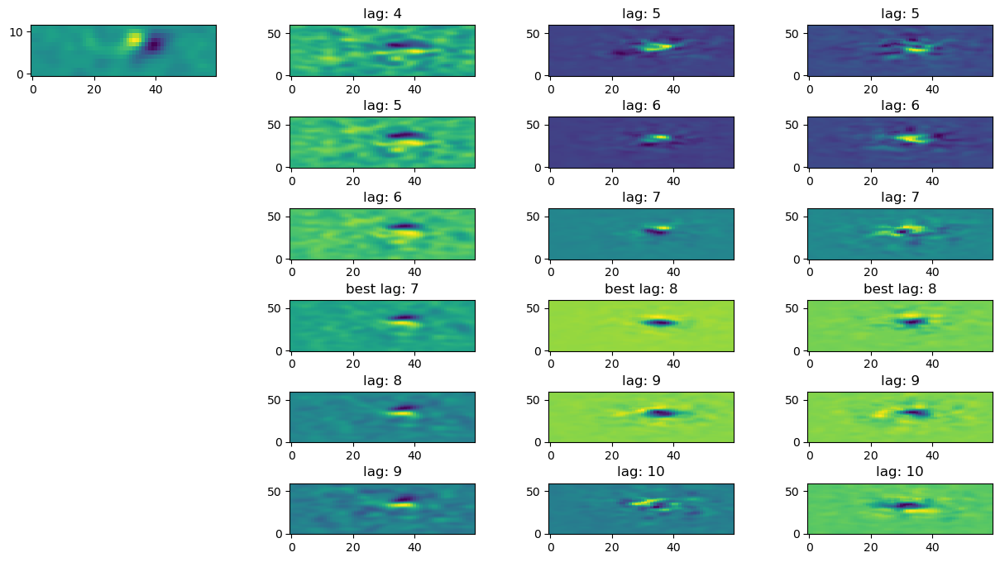

complexity: 0.948 | LL: -0.153 | direction: 0.008 | angle: 0°


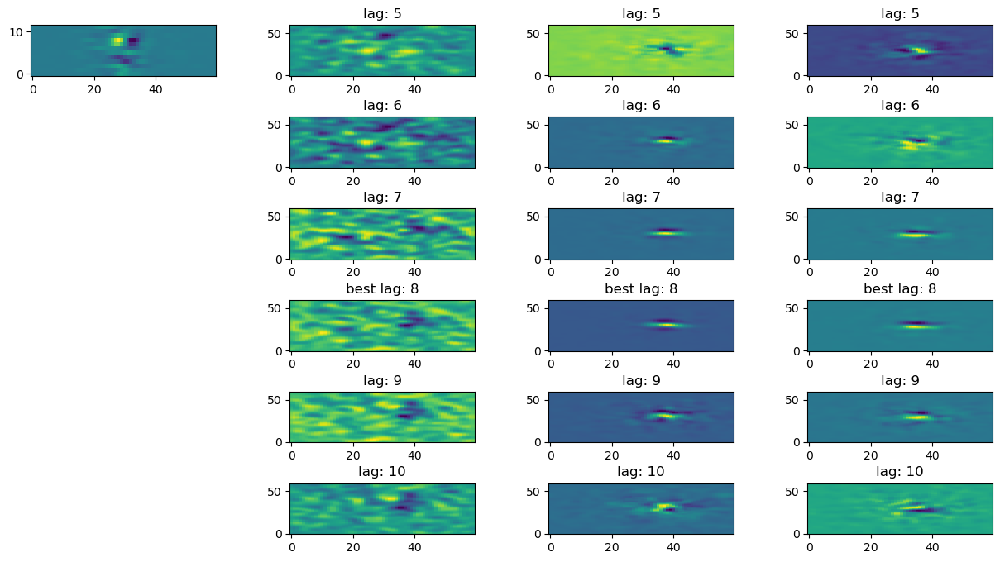

complexity: 0.004 | LL: -1.457 | direction: 0.011 | angle: 27°


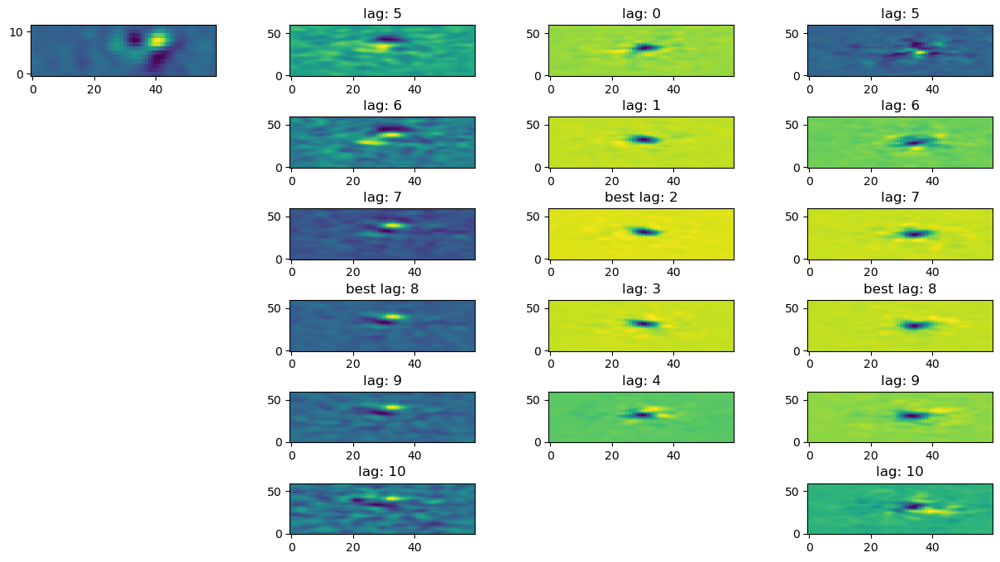

complexity: 0.001 | LL: -2.053 | direction: 0.016 | angle: 27°


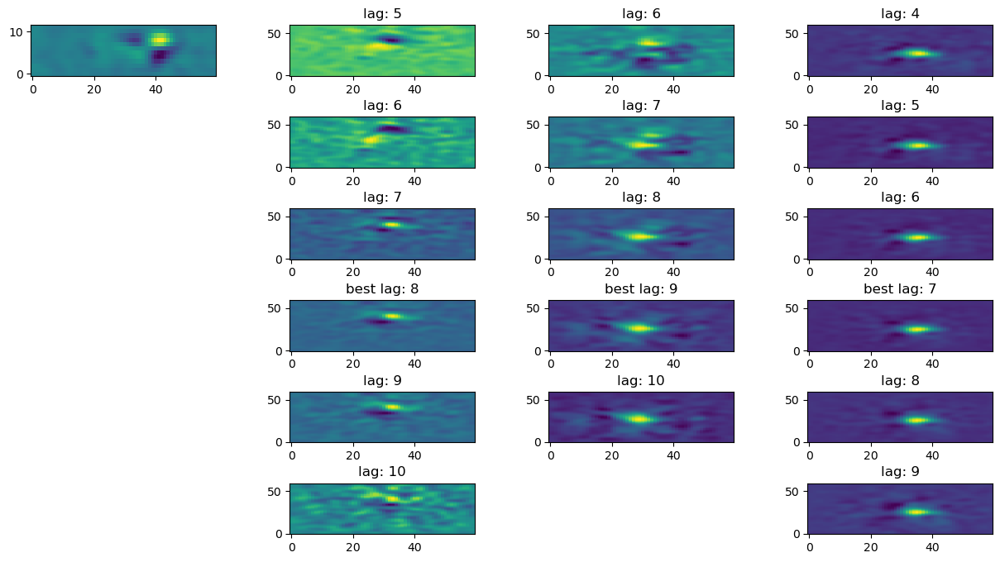

complexity: 0.156 | LL: 0.419 | direction: 0.017 | angle: 63°


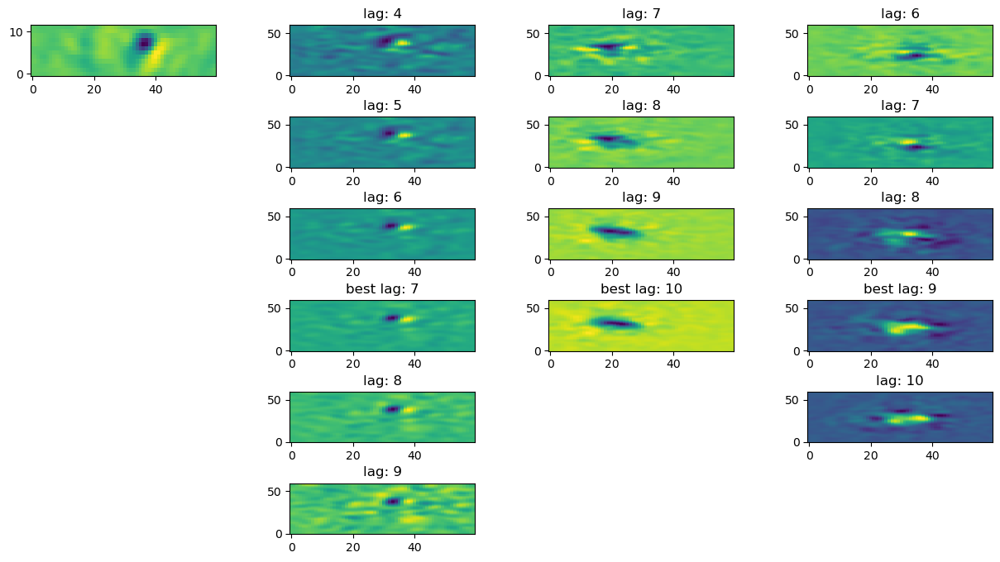

complexity: 0.0 | LL: 0.922 | direction: 0.021 | angle: 72°


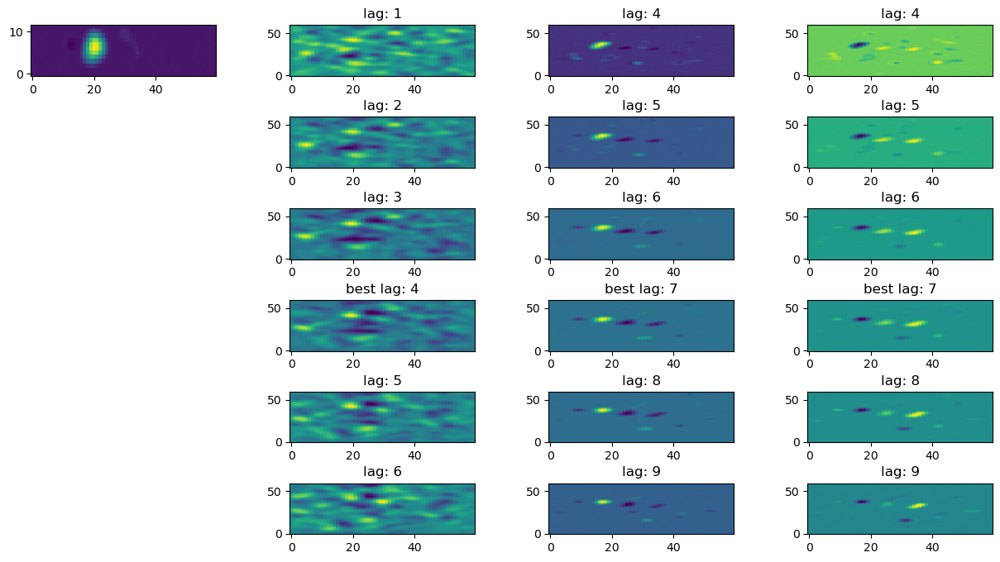

complexity: 0.0 | LL: 0.349 | direction: 0.021 | angle: 45°


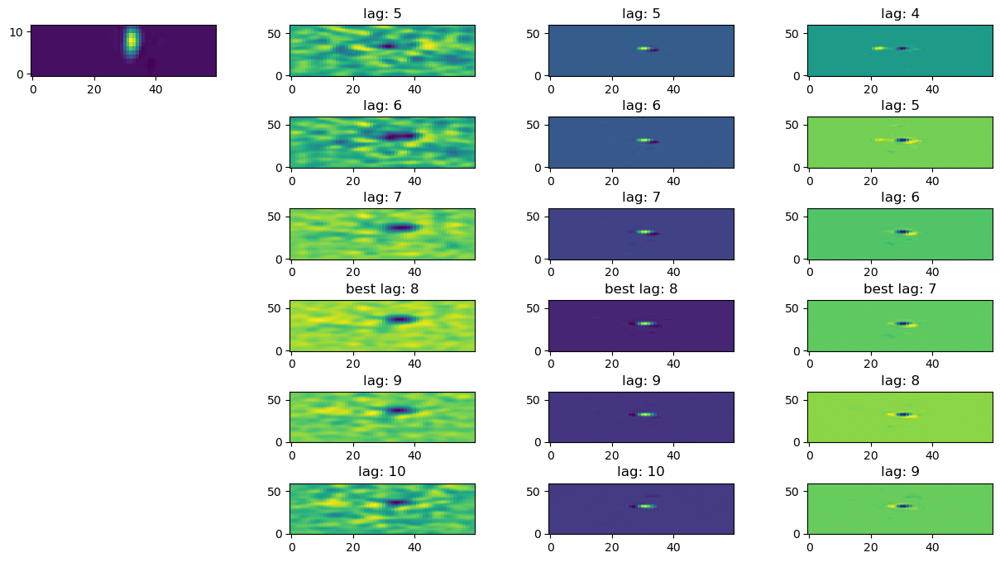

complexity: 0.218 | LL: 0.211 | direction: 0.024 | angle: 0°


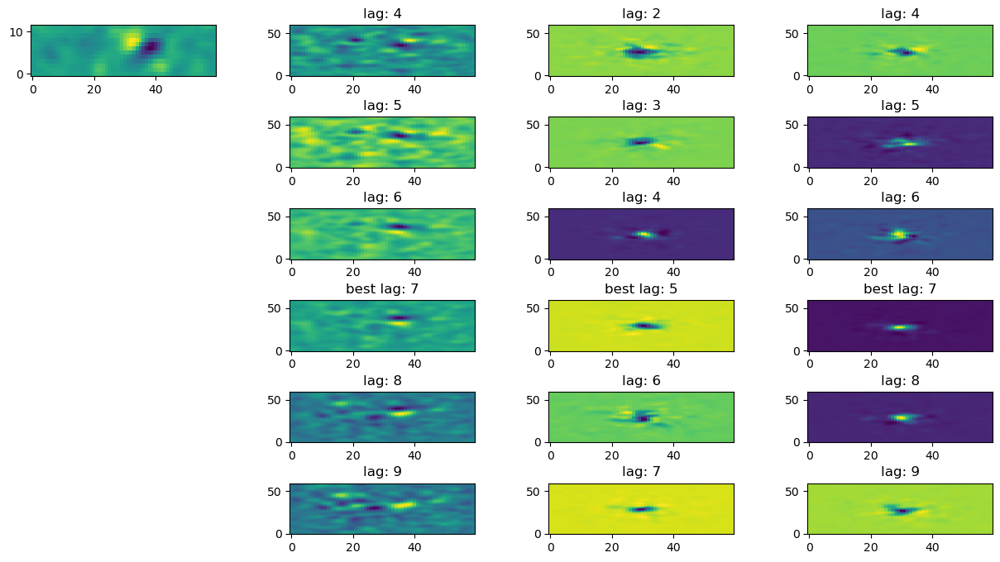

complexity: 0.734 | LL: -1.45 | direction: 0.027 | angle: 63°


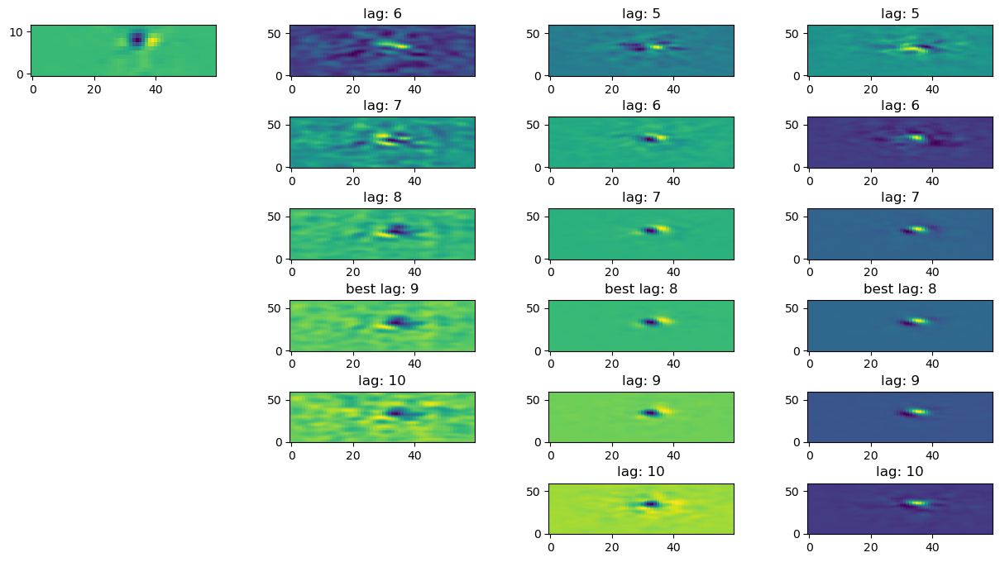

complexity: 0.618 | LL: -2.704 | direction: 0.03 | angle: 11°


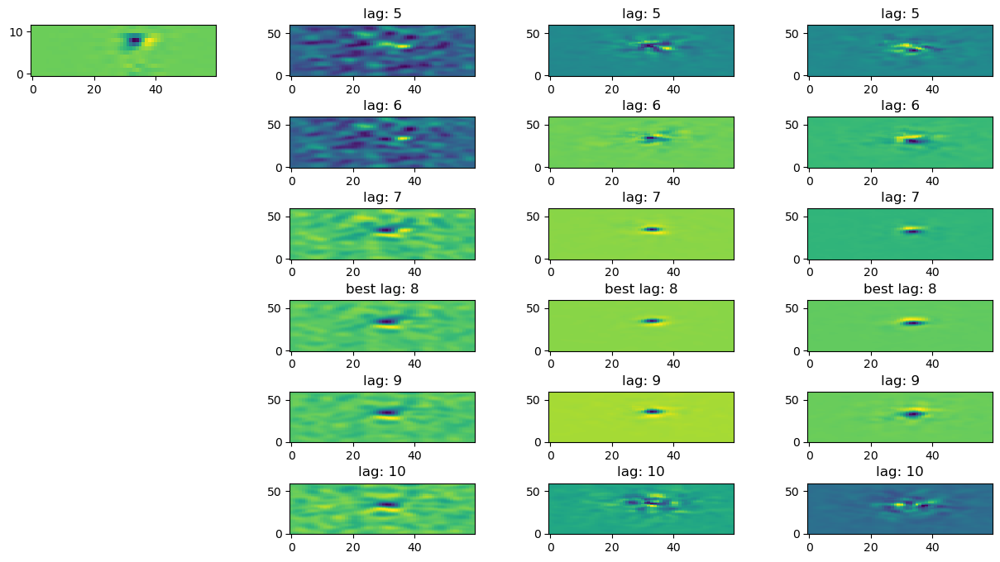

complexity: 0.497 | LL: -0.643 | direction: 0.031 | angle: 72°


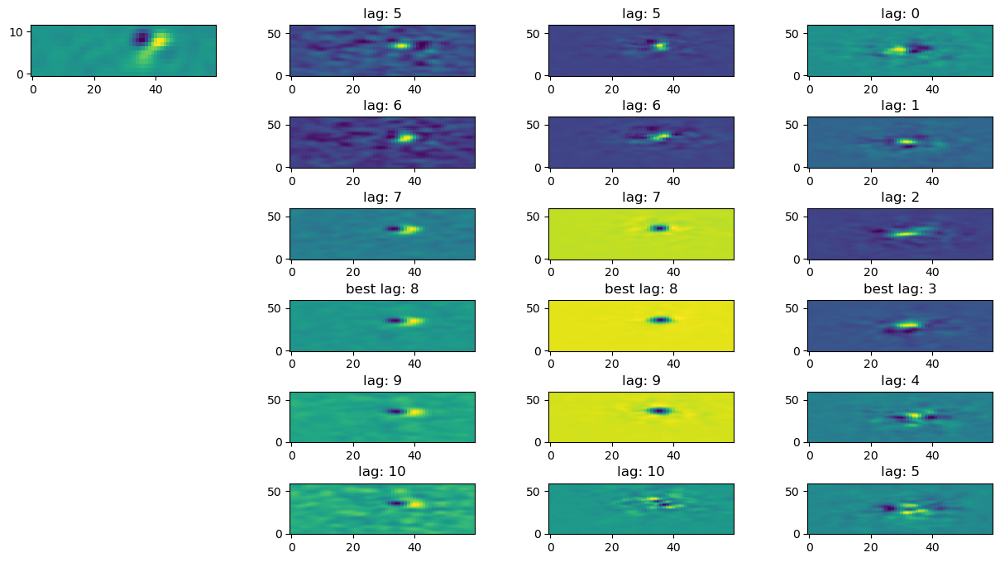

complexity: 0.017 | LL: -1.58 | direction: 0.032 | angle: 45°


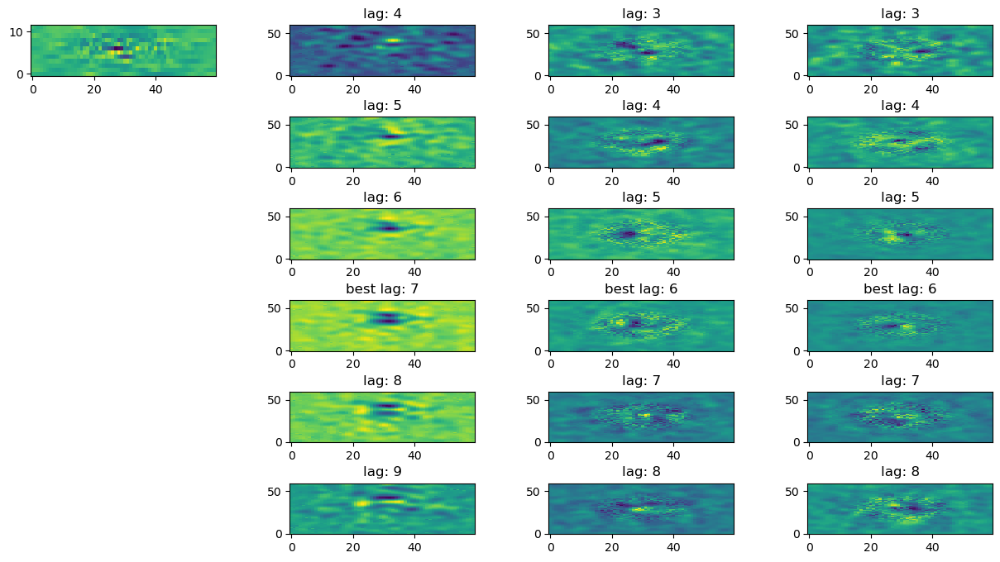

complexity: 0.556 | LL: 0.386 | direction: 0.037 | angle: 18°


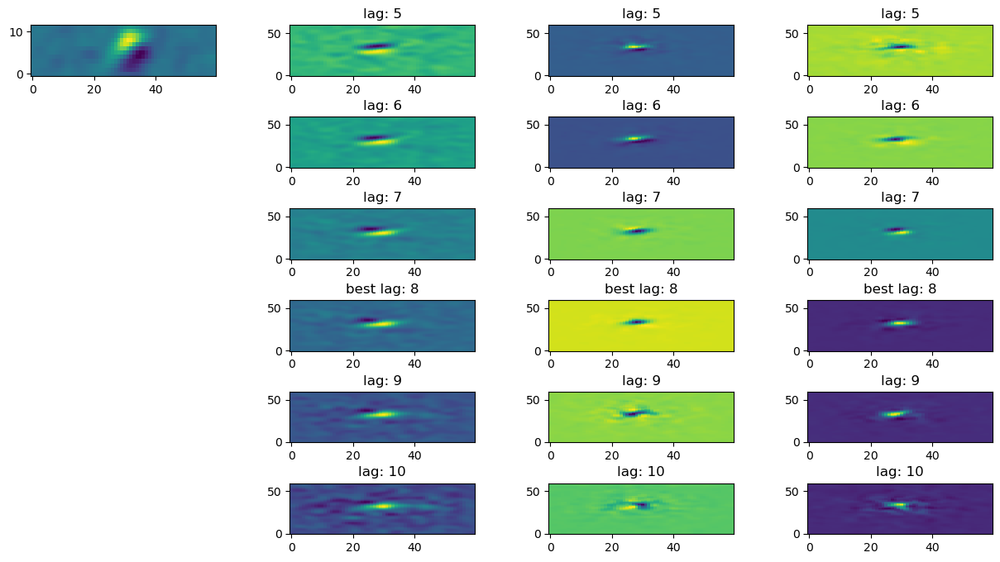

complexity: 0.012 | LL: 0.847 | direction: 0.038 | angle: 45°


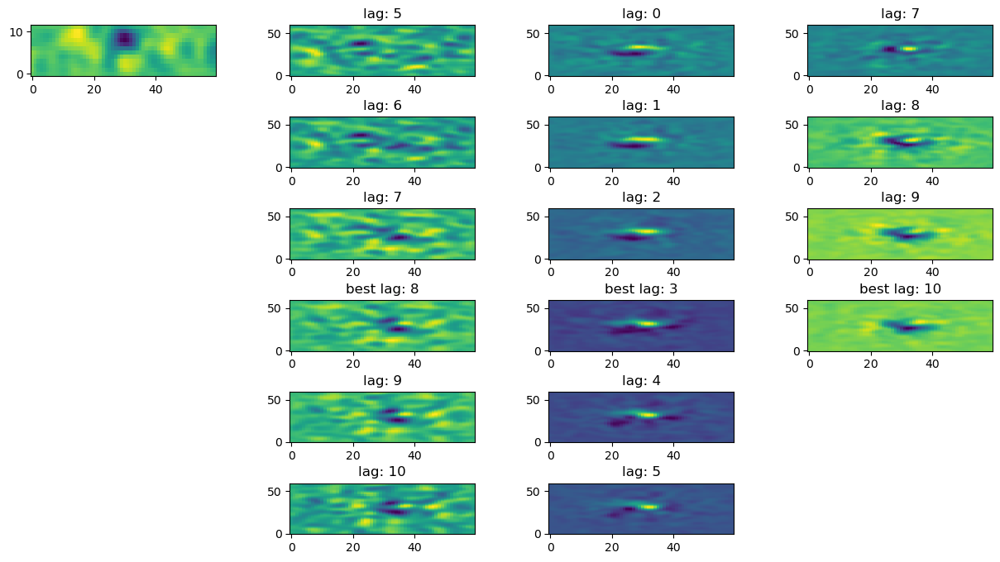

complexity: 0.028 | LL: 0.139 | direction: 0.043 | angle: 63°


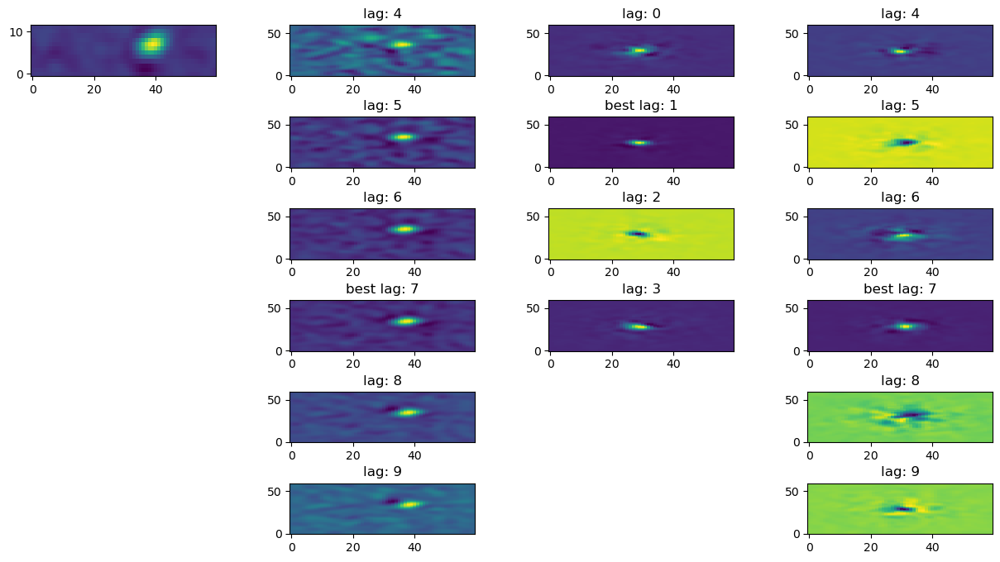

complexity: 0.524 | LL: -0.843 | direction: 0.049 | angle: 0°


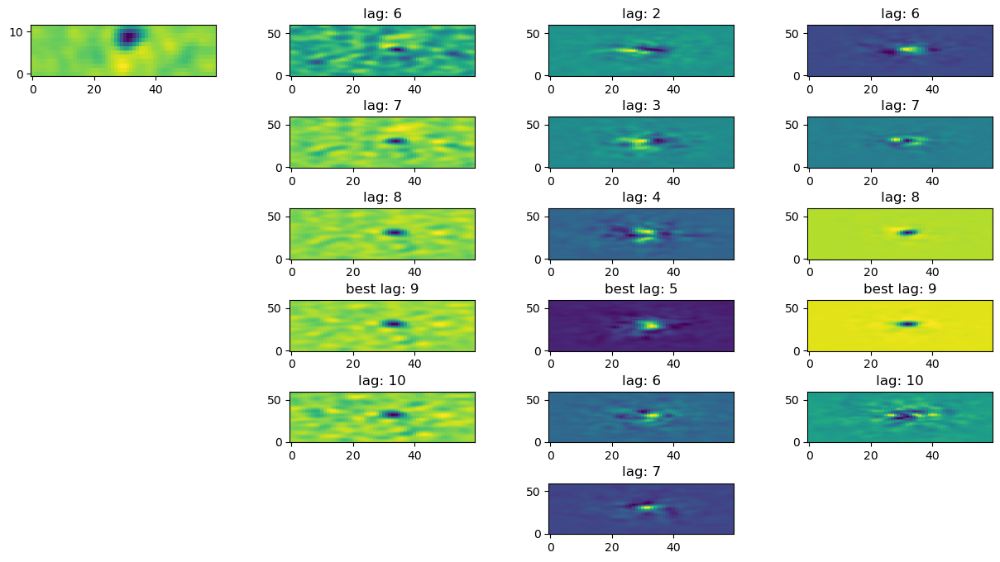

complexity: 0.0 | LL: 0.672 | direction: 0.051 | angle: 72°


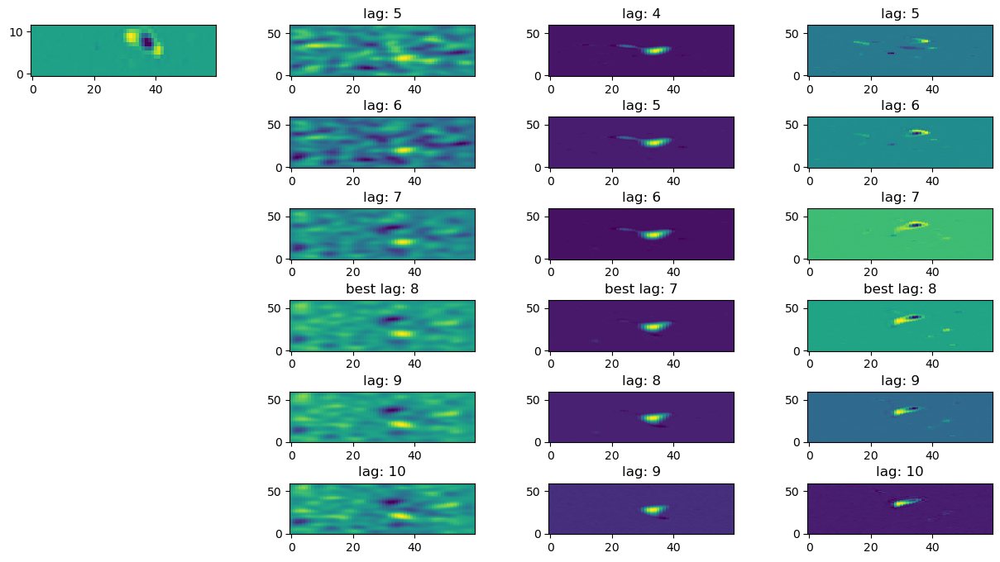

complexity: 0.0 | LL: 0.355 | direction: 0.051 | angle: 45°


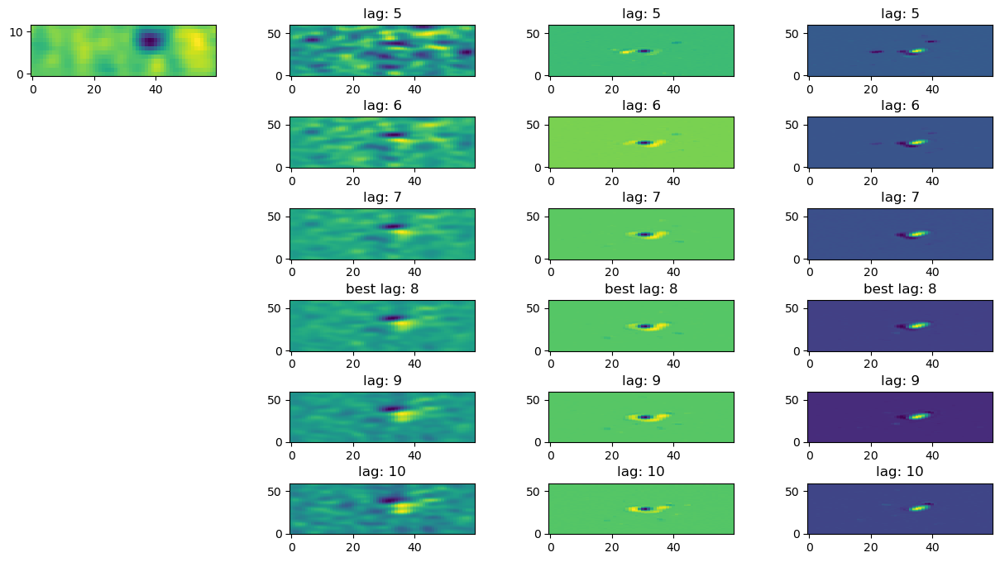

complexity: 0.28 | LL: -0.357 | direction: 0.054 | angle: 72°


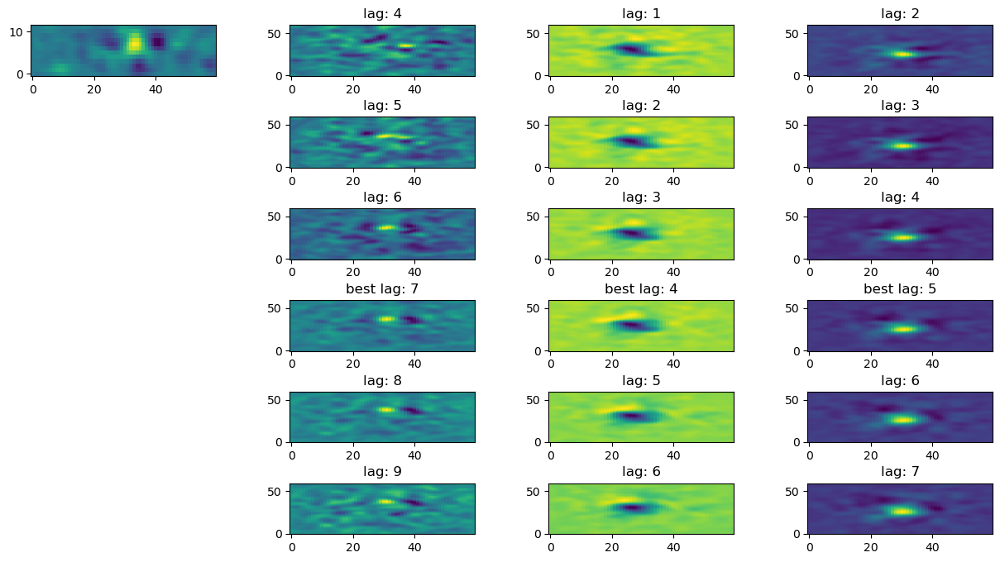

complexity: 0.585 | LL: 0.712 | direction: 0.054 | angle: 63°


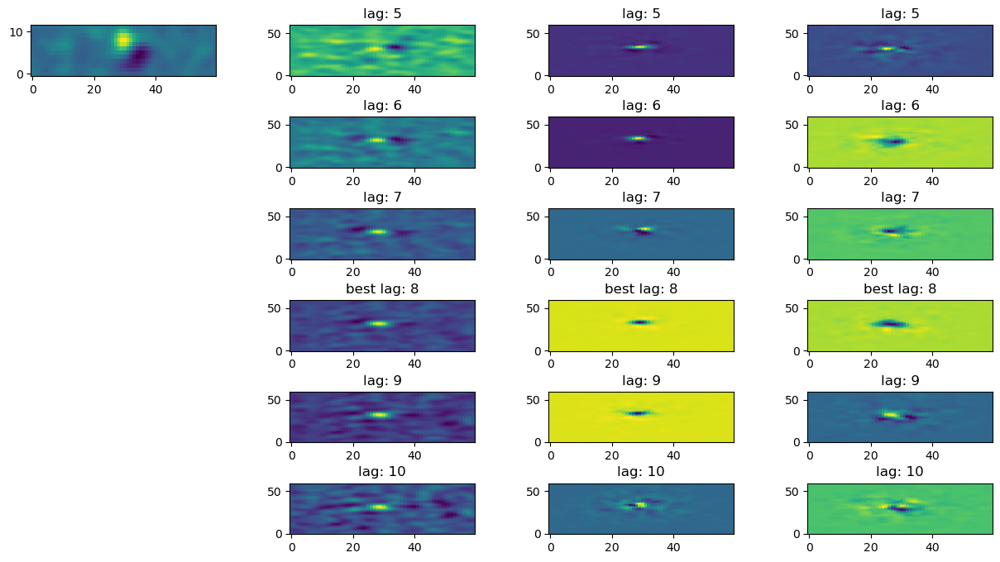

complexity: 0.837 | LL: -0.288 | direction: 0.054 | angle: 45°


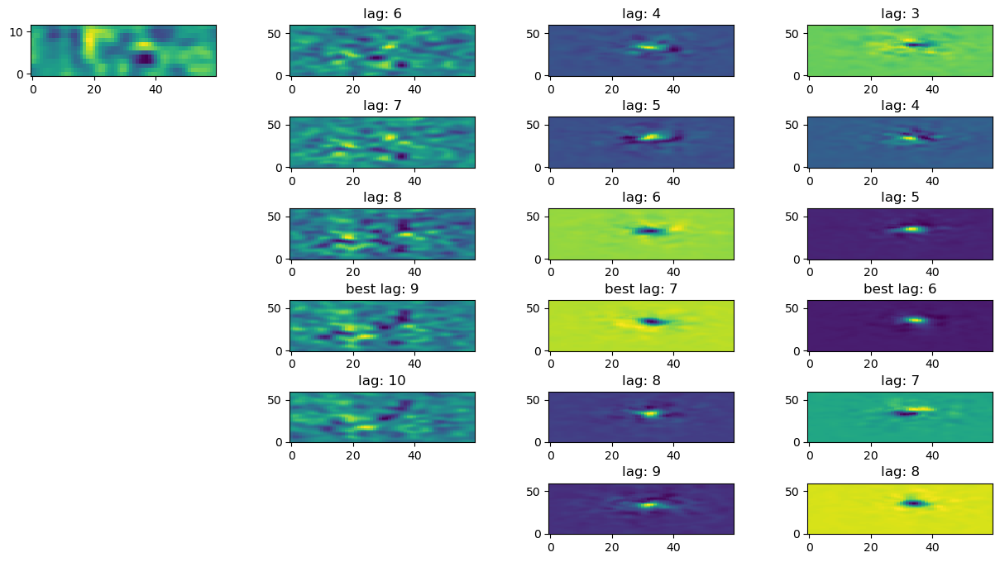

complexity: 0.598 | LL: 0.448 | direction: 0.055 | angle: 45°


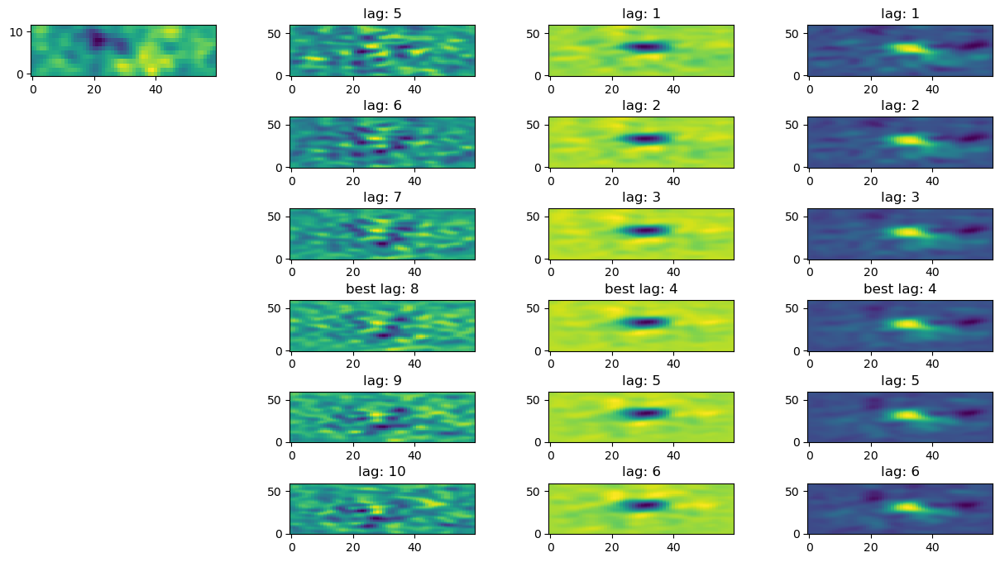

complexity: 0.783 | LL: -0.353 | direction: 0.055 | angle: 37°


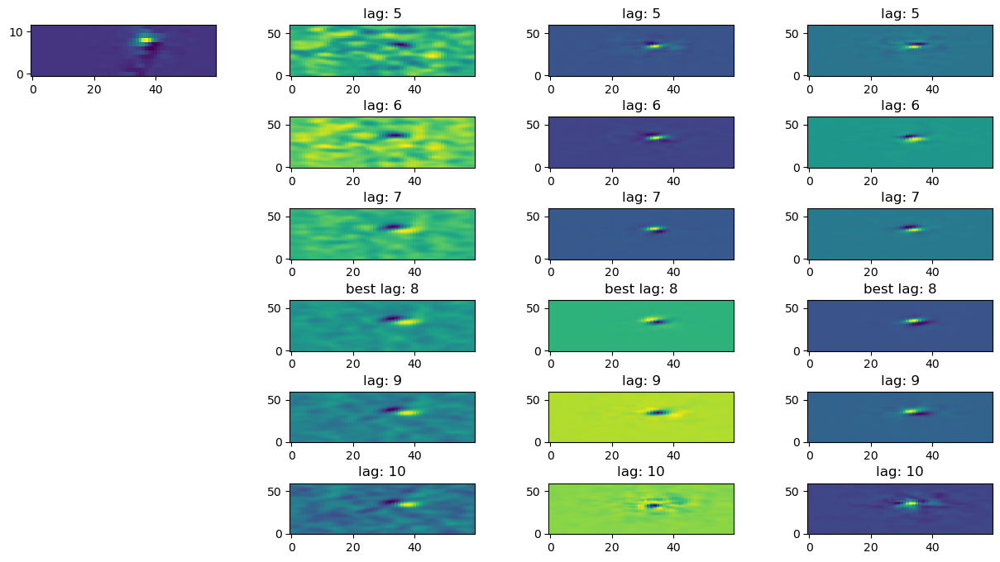

complexity: 0.752 | LL: -2.086 | direction: 0.057 | angle: 45°


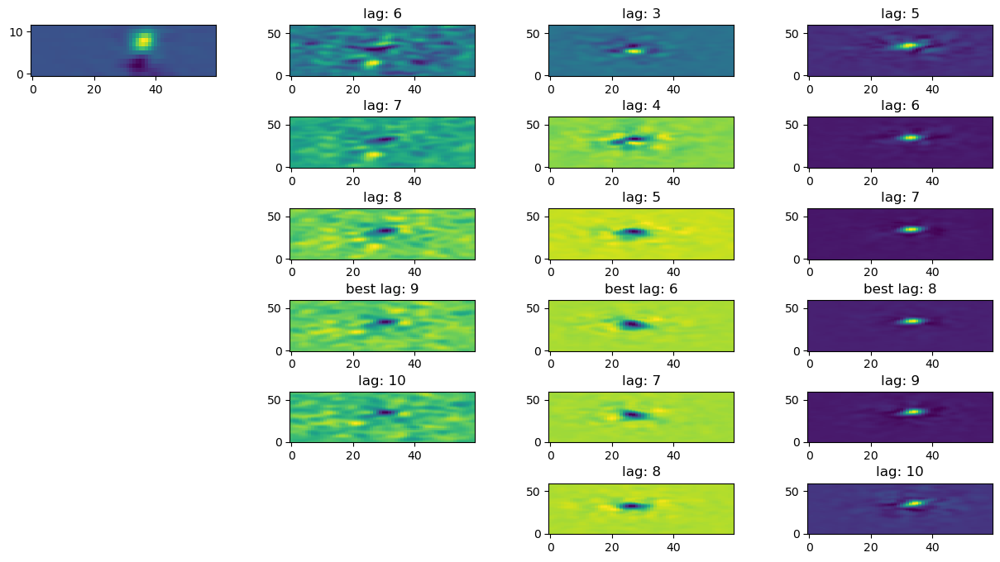

complexity: 0.039 | LL: 0.08 | direction: 0.057 | angle: 45°


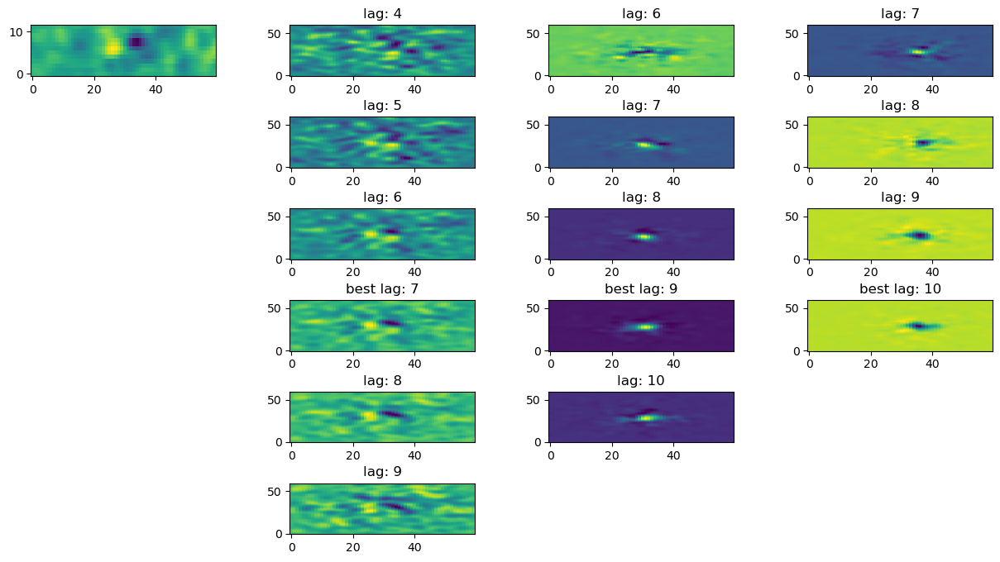

complexity: 0.279 | LL: 0.546 | direction: 0.105 | angle: 0°


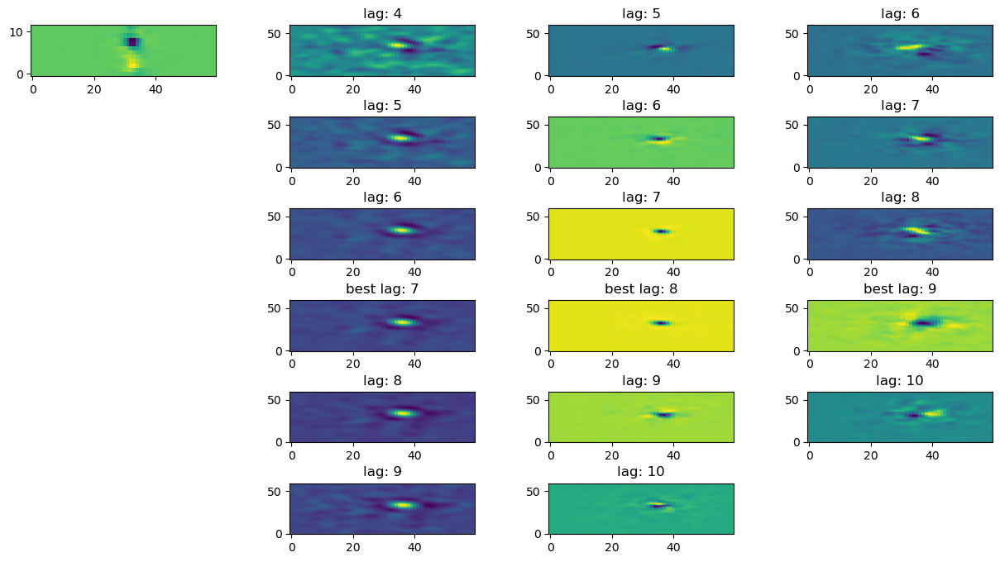

complexity: 0.548 | LL: -1.638 | direction: 0.106 | angle: 14°


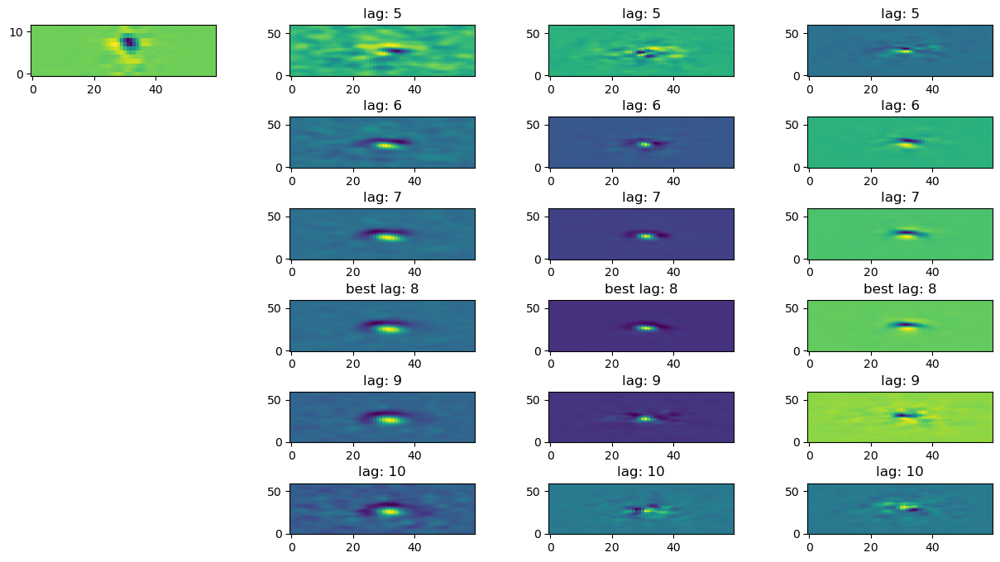

complexity: 0.199 | LL: 0.172 | direction: 0.114 | angle: 0°


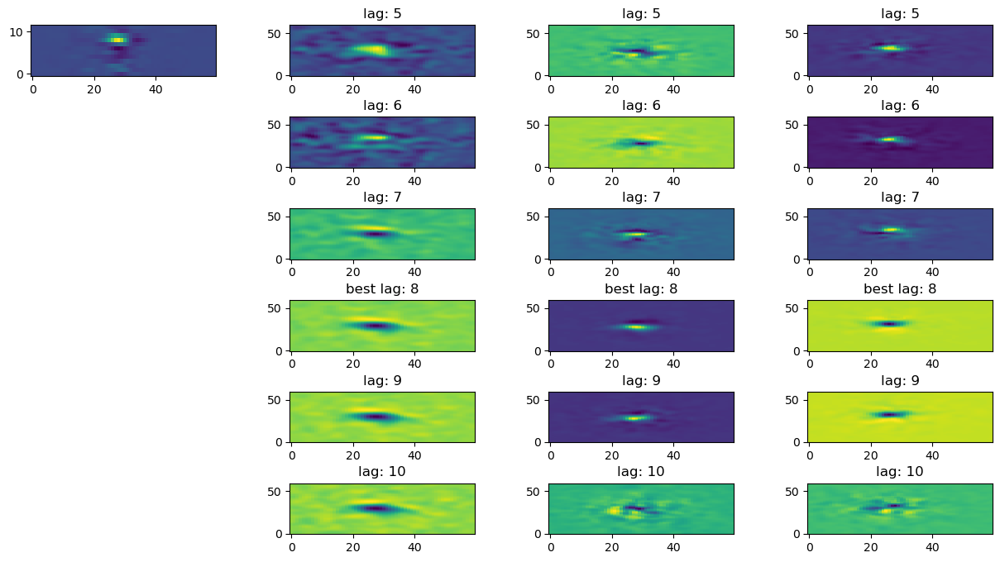

complexity: 0.419 | LL: 0.585 | direction: 0.114 | angle: 45°


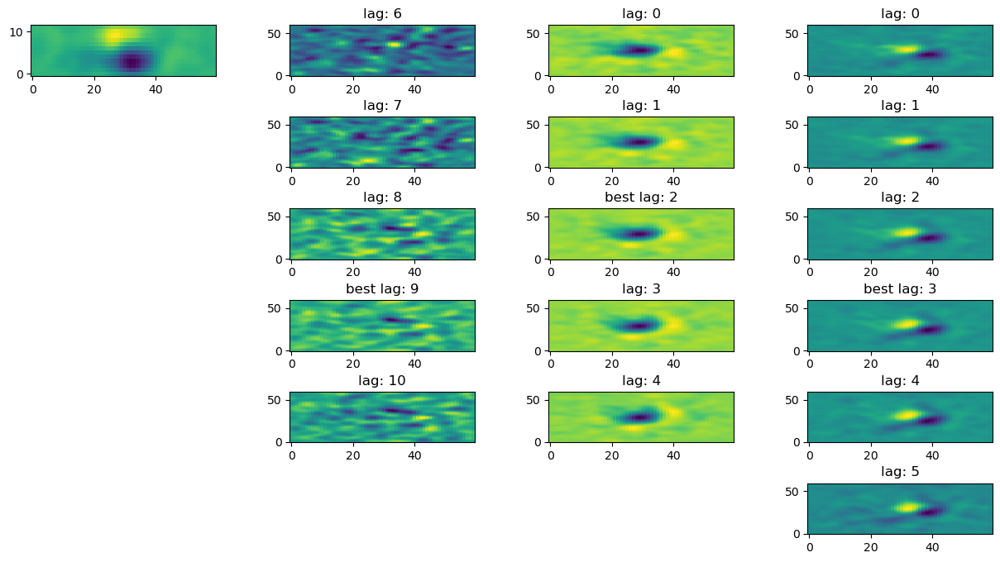

complexity: 0.495 | LL: 0.739 | direction: 0.115 | angle: 63°


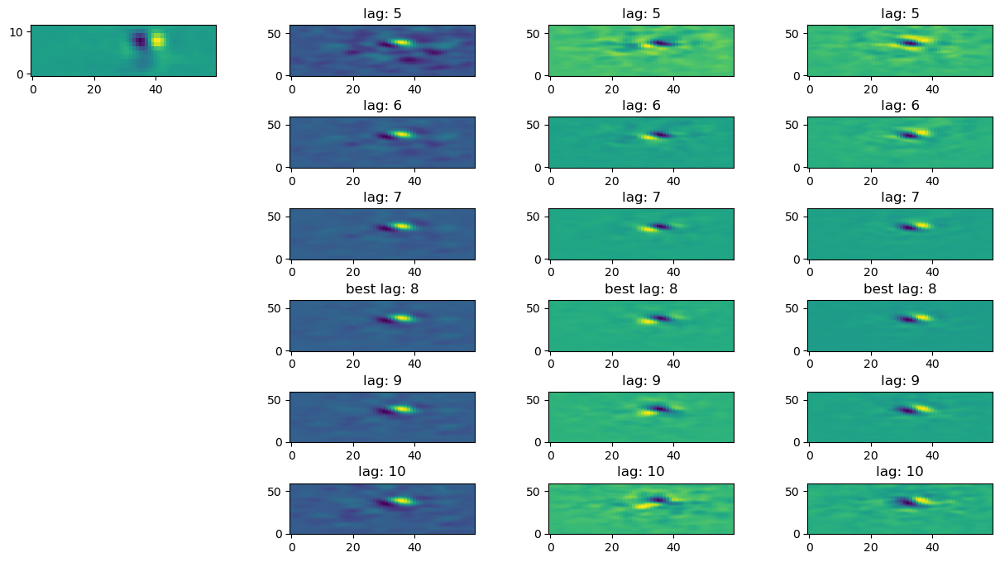

complexity: 0.673 | LL: -0.008 | direction: 0.117 | angle: 56°


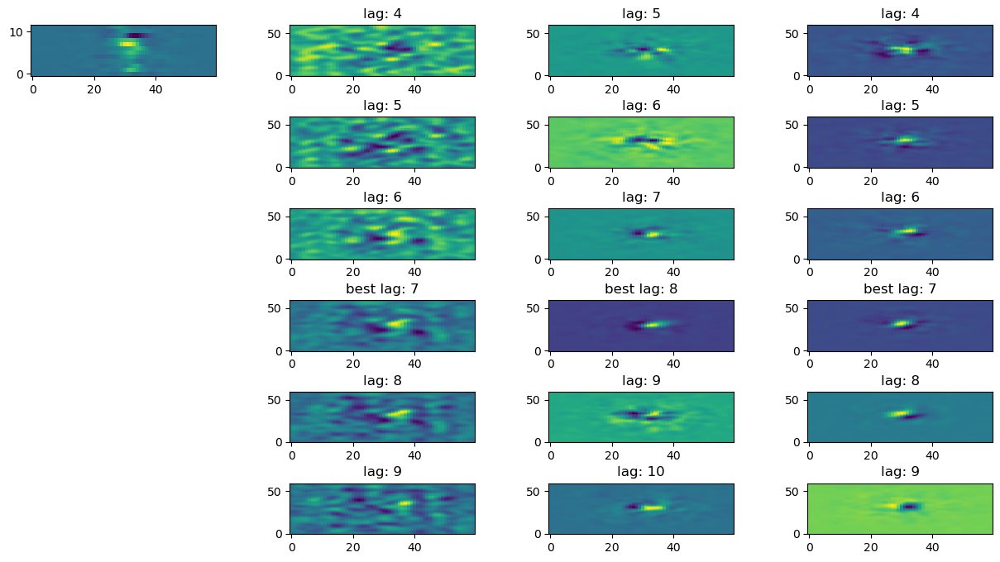

complexity: 0.442 | LL: 0.516 | direction: 0.117 | angle: 45°


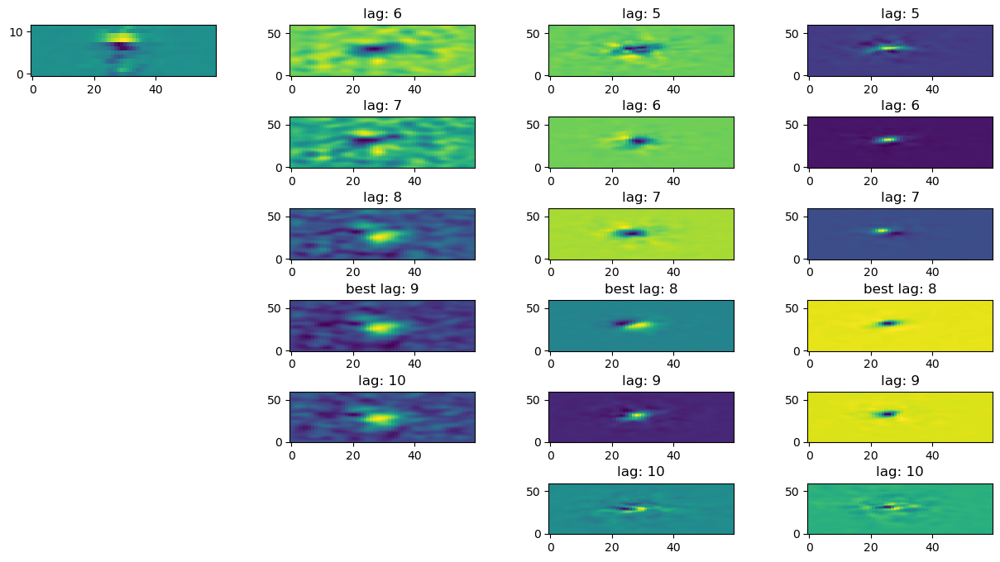

complexity: 0.594 | LL: -0.4 | direction: 0.123 | angle: 76°


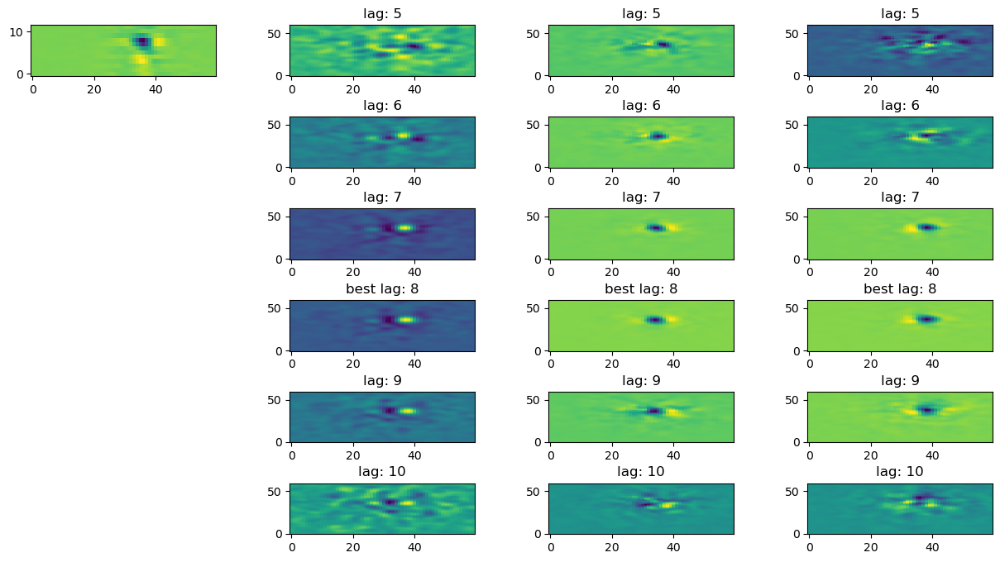

complexity: 0.913 | LL: -1.034 | direction: 0.126 | angle: 18°


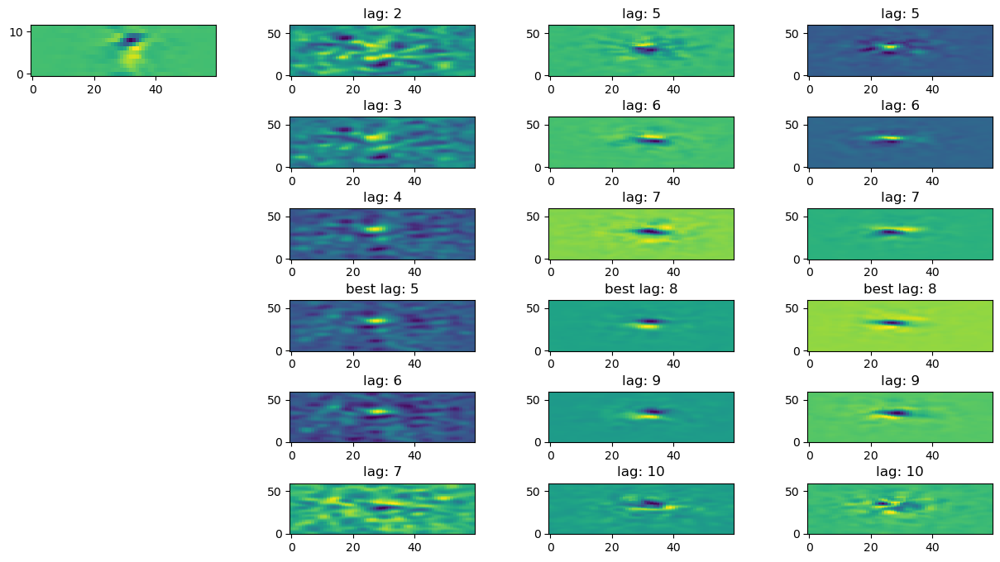

complexity: 0.631 | LL: 0.456 | direction: 0.127 | angle: 0°


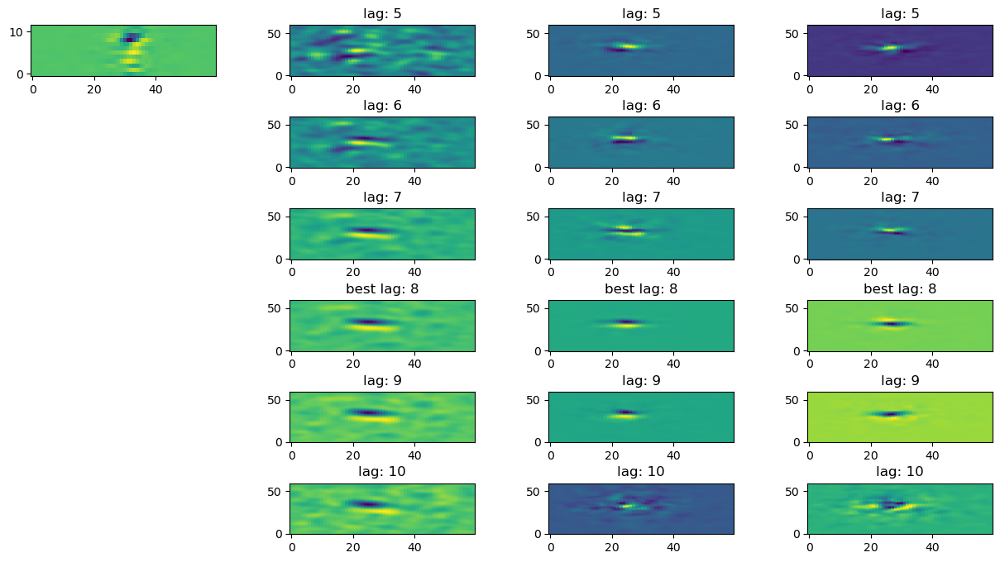

complexity: 0.463 | LL: 0.321 | direction: 0.133 | angle: 45°


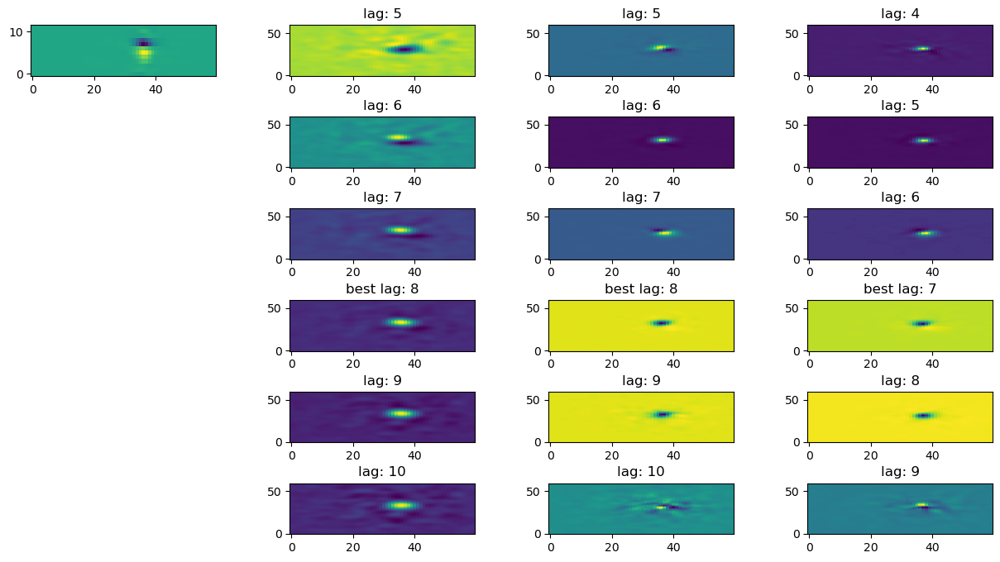

complexity: 0.01 | LL: 0.855 | direction: 0.153 | angle: 0°


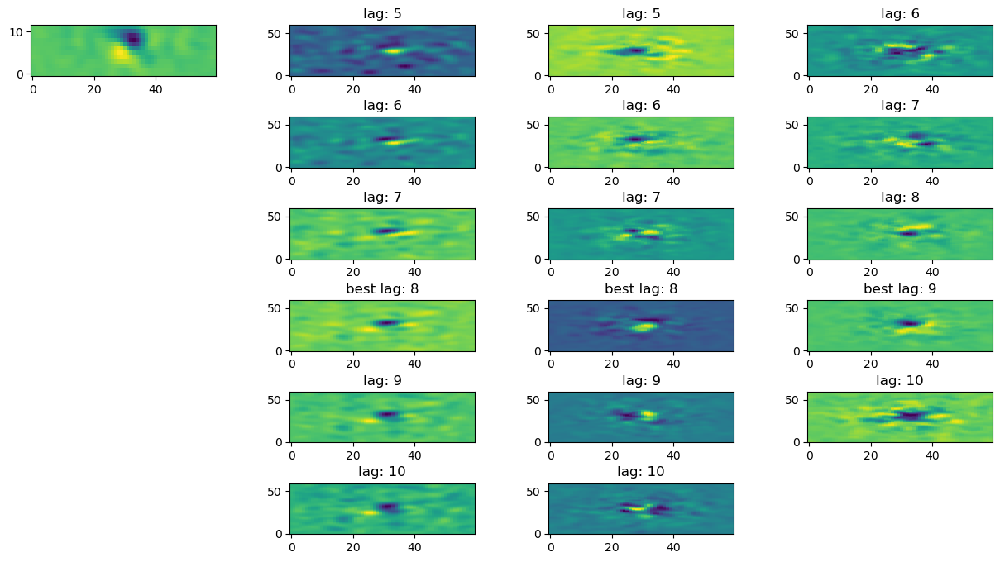

complexity: 0.424 | LL: -0.287 | direction: 0.157 | angle: 76°


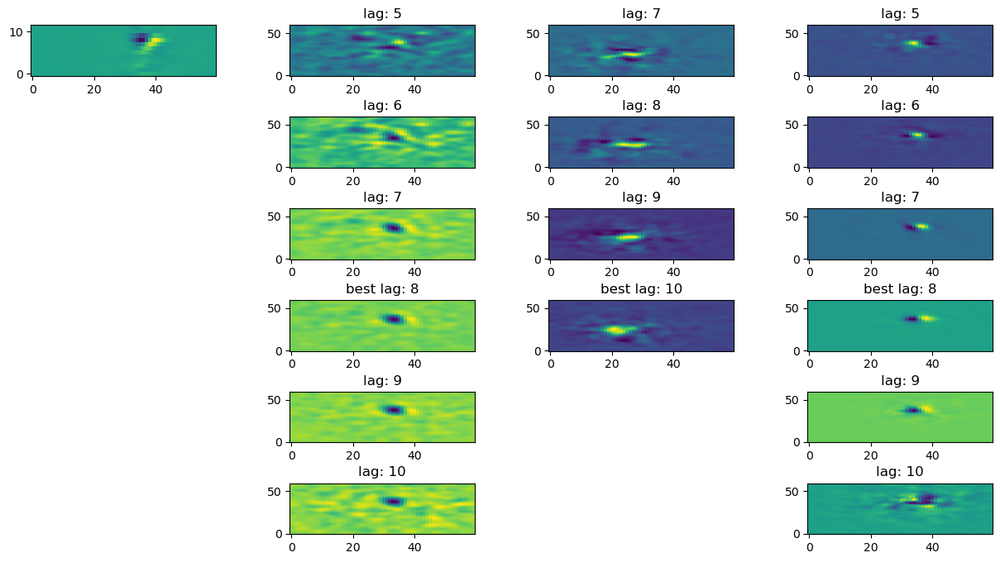

complexity: 0.618 | LL: -0.503 | direction: 0.167 | angle: 14°


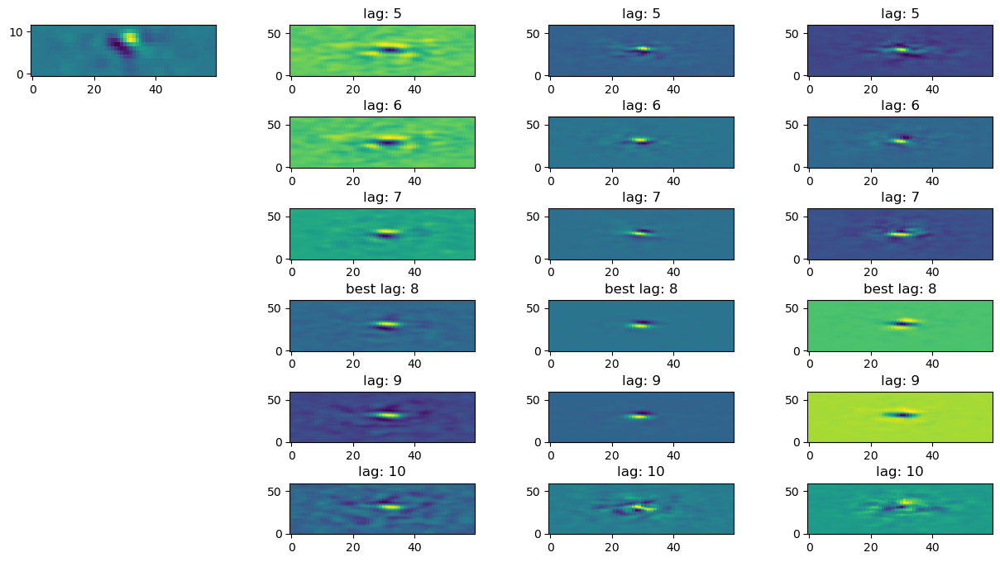

complexity: 0.823 | LL: -1.273 | direction: 0.167 | angle: 14°


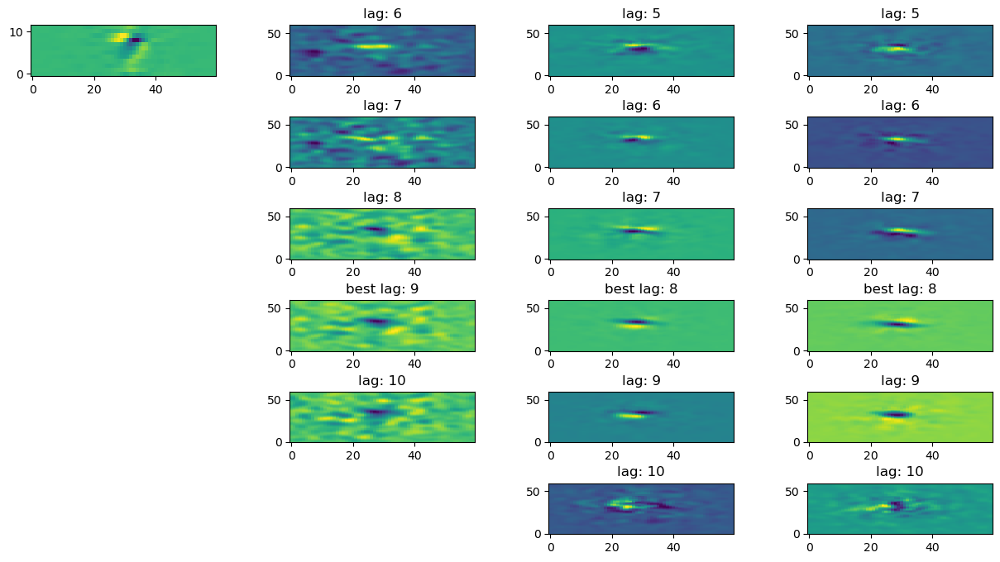

complexity: 0.767 | LL: -1.249 | direction: 0.172 | angle: 0°


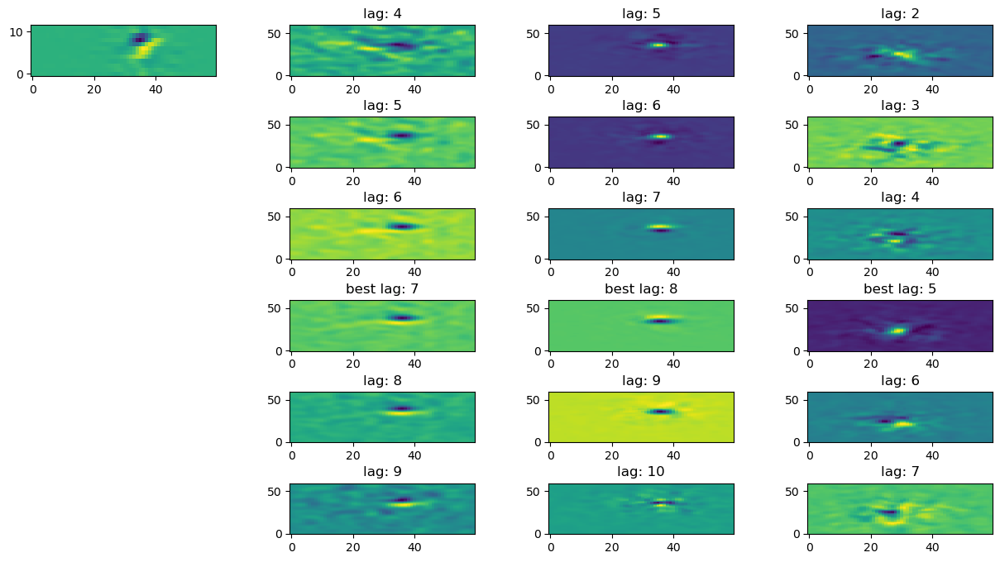

complexity: 0.908 | LL: -1.056 | direction: 0.191 | angle: 11°


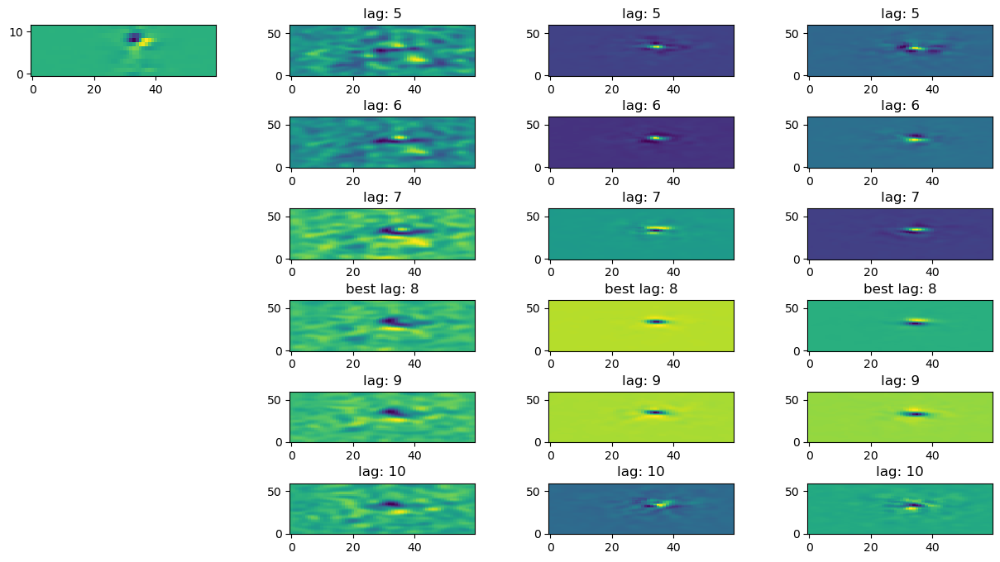

complexity: 0.71 | LL: -0.632 | direction: 0.193 | angle: 0°


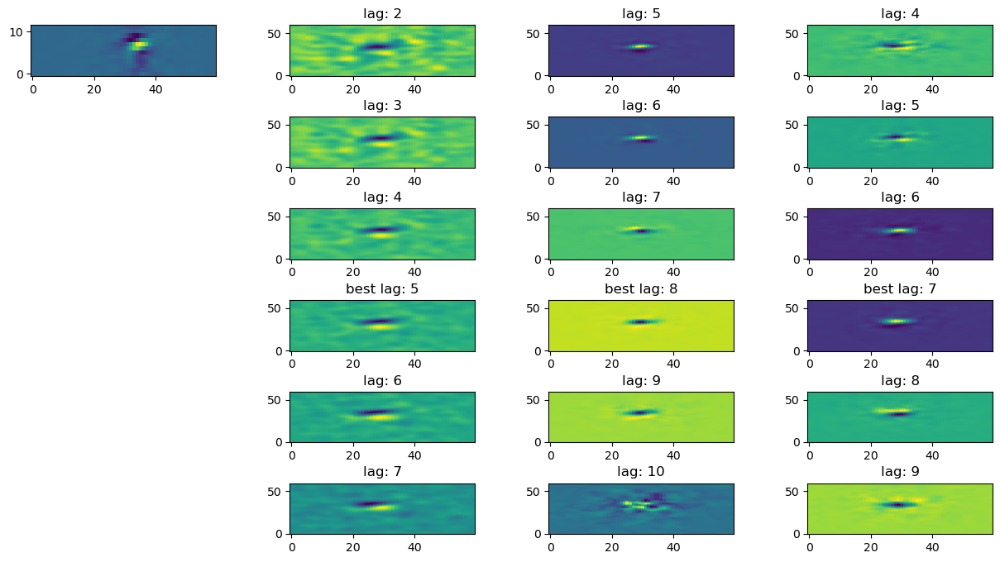

complexity: 0.97 | LL: -1.033 | direction: 0.198 | angle: 59°


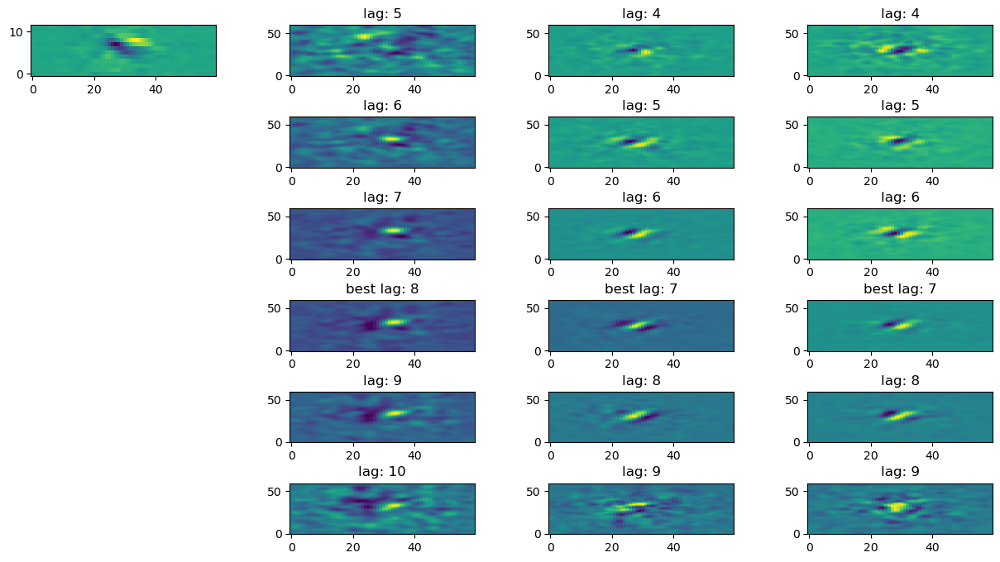

complexity: 0.618 | LL: -2.128 | direction: 0.204 | angle: 31°


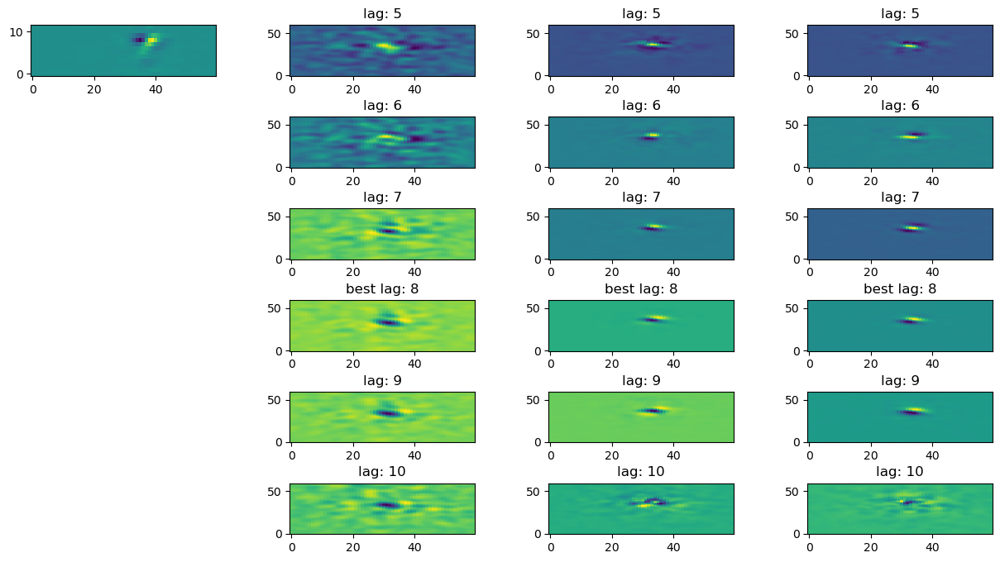

complexity: 0.148 | LL: -3.446 | direction: 0.211 | angle: 90°


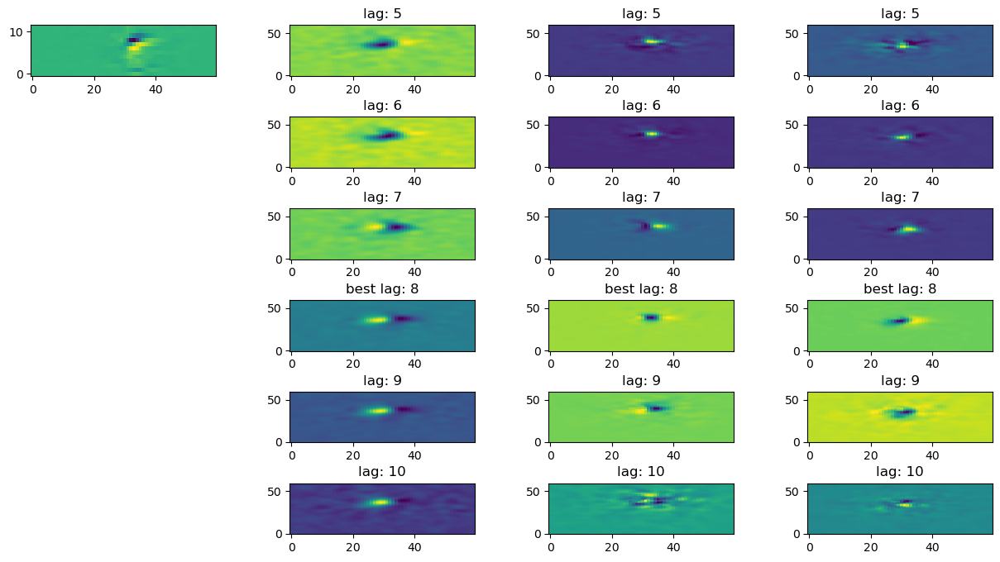

complexity: 0.494 | LL: -1.53 | direction: 0.233 | angle: 59°


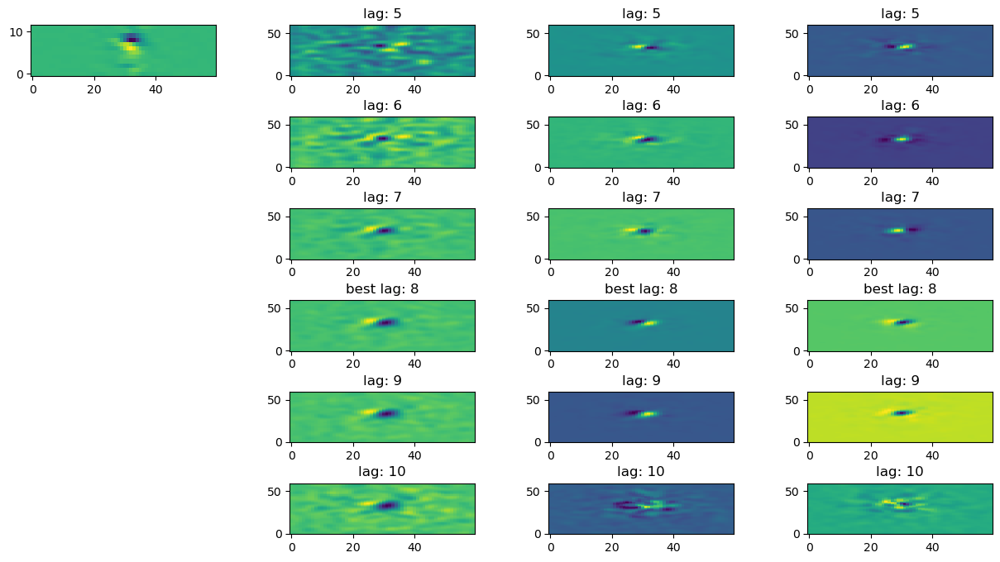

complexity: 0.137 | LL: 0.689 | direction: 0.235 | angle: 45°


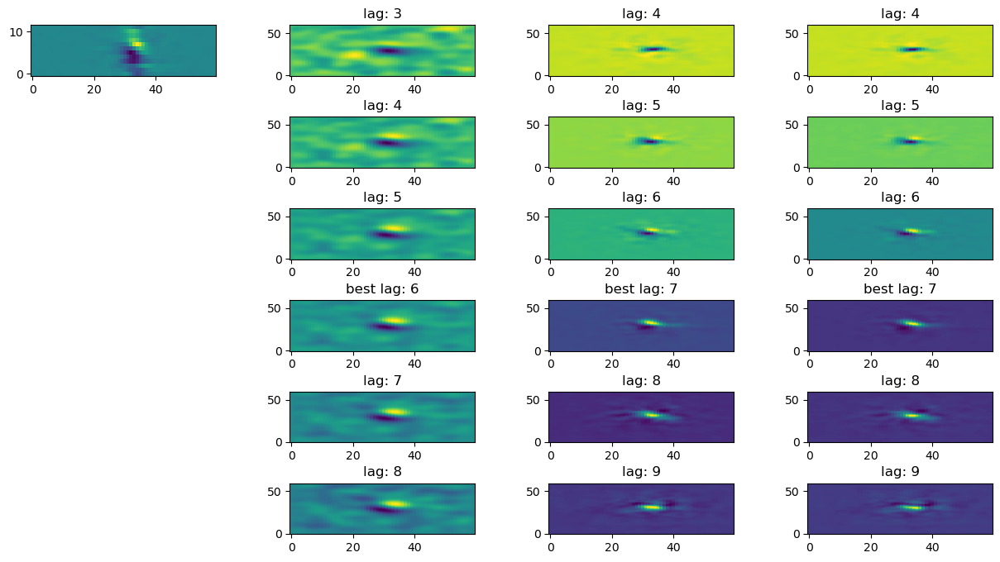

complexity: 0.559 | LL: -1.357 | direction: 0.244 | angle: 27°


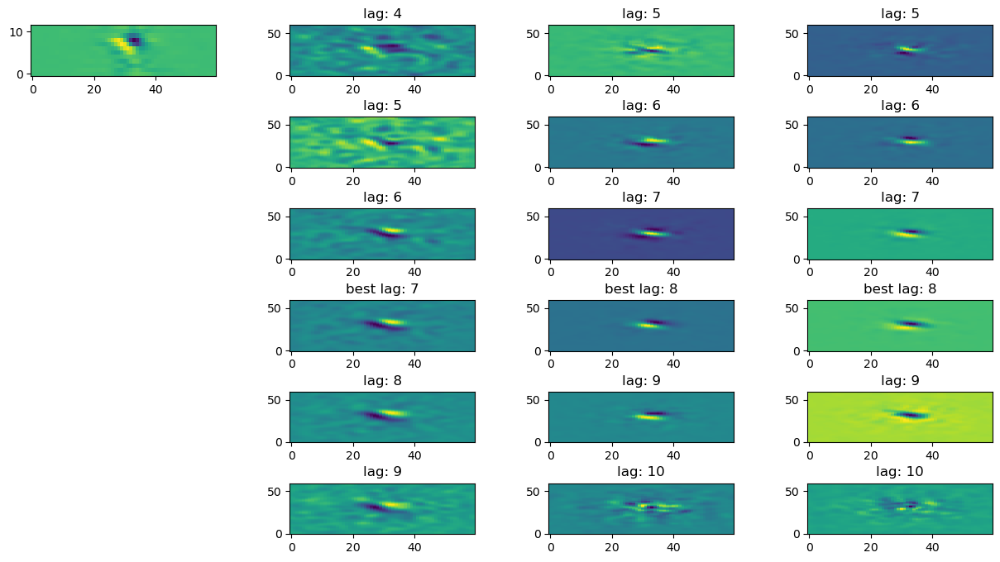

complexity: 0.988 | LL: -0.956 | direction: 0.257 | angle: 53°


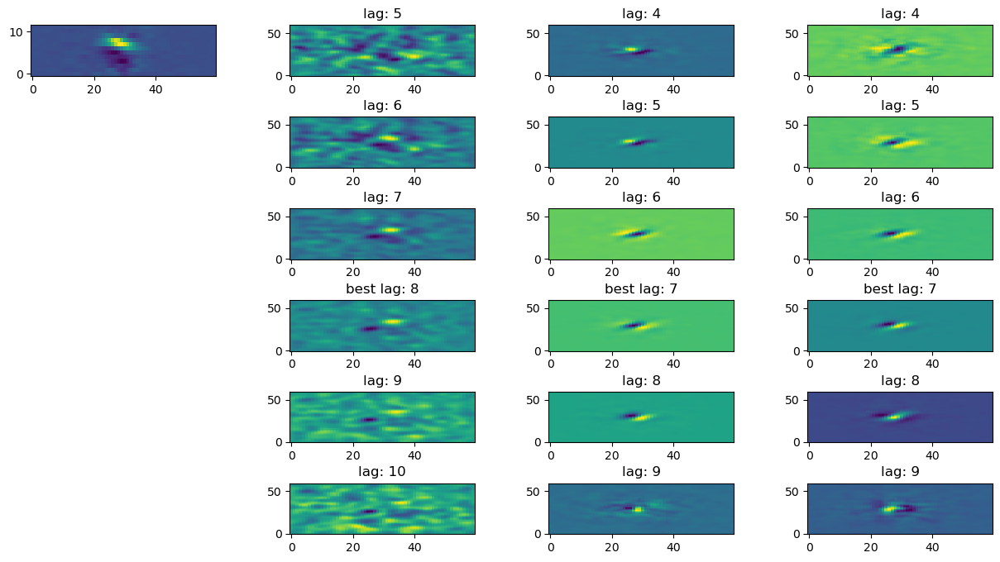

complexity: 0.697 | LL: 0.092 | direction: 0.265 | angle: 27°


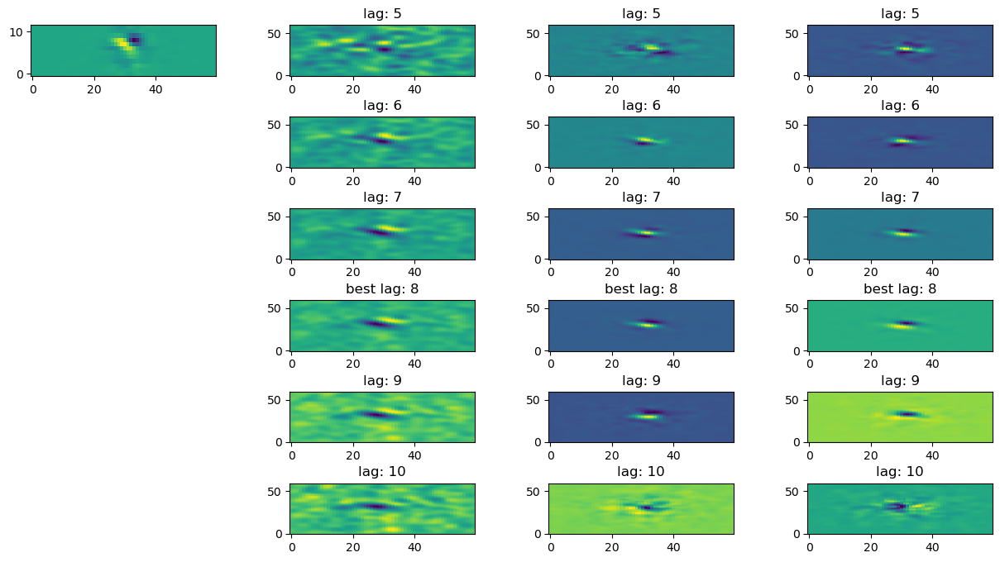

complexity: 0.648 | LL: -1.315 | direction: 0.285 | angle: 68°


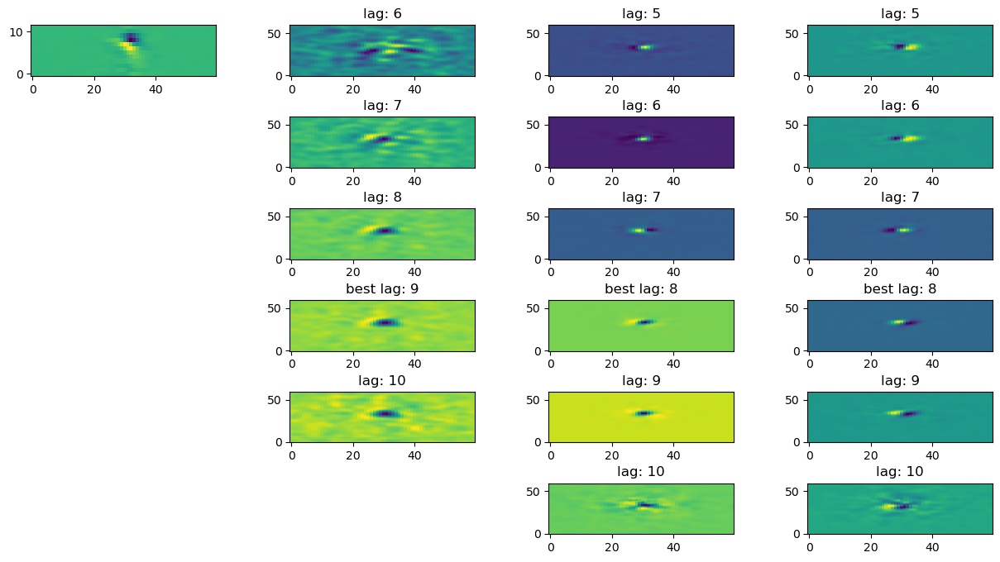

complexity: 0.356 | LL: 0.089 | direction: 0.313 | angle: 27°


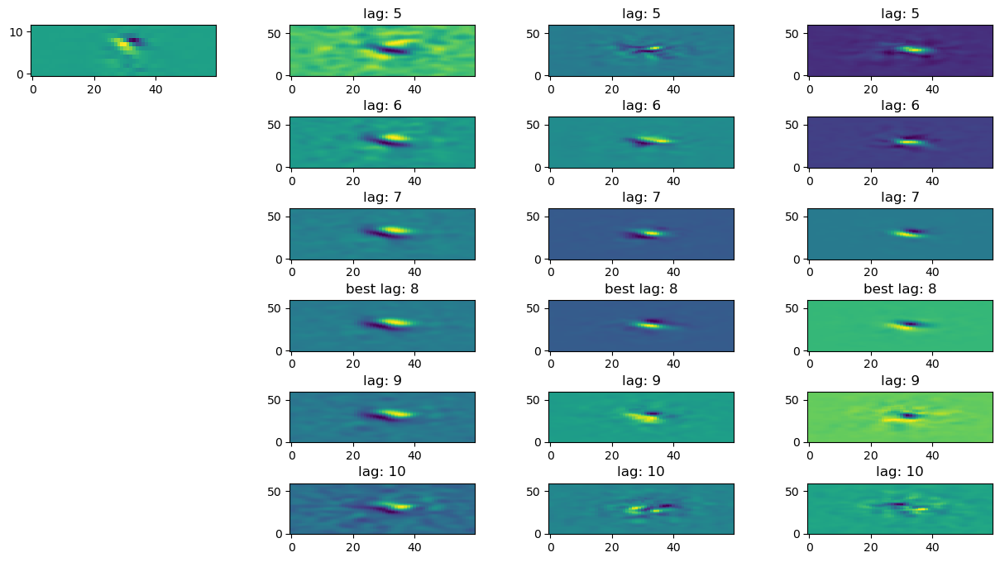

complexity: 0.328 | LL: -1.286 | direction: 0.328 | angle: 31°


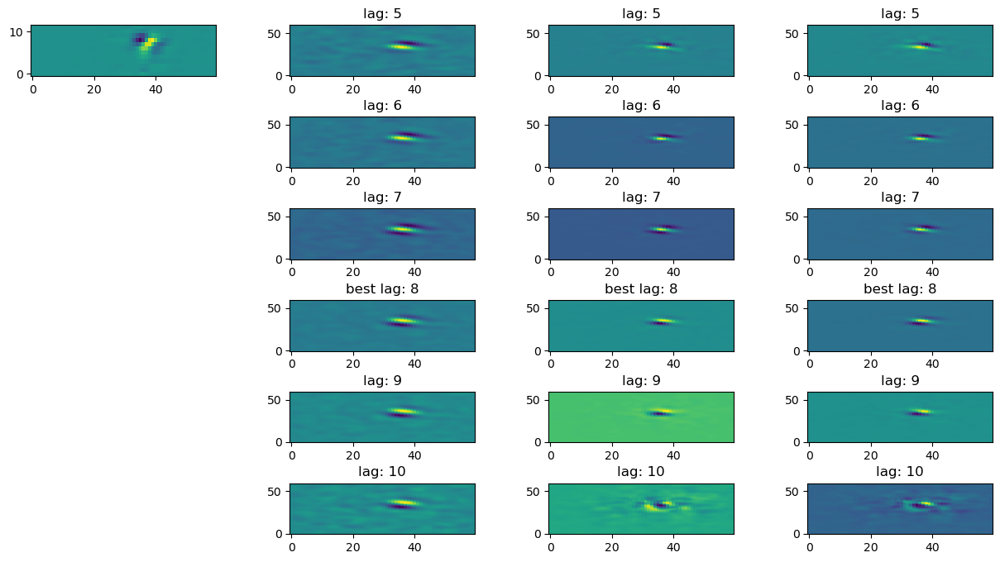

complexity: 0.871 | LL: -0.438 | direction: 0.338 | angle: 27°


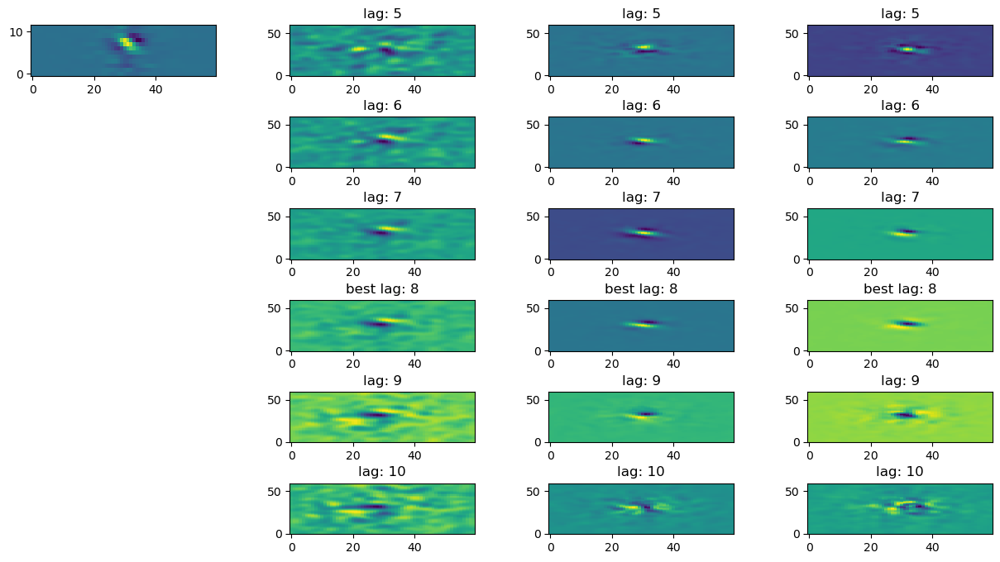

In [105]:
# plot sample direction cells
# get top and bottom cells
cell_inds = []
#cell_inds.extend(np.flip(np.argsort(complex_scores)[::-1][-30:]))
#cell_inds.extend(np.flip(np.argsort(complex_scores)[::-1][:30]))
cell_inds.extend(np.flip(np.argsort(direction_scores)[::-1][-80:]))
cell_inds.extend(np.flip(np.argsort(direction_scores)[::-1][:30]))
for i in range(110):
    cc = cell_inds[i]
    
    if direction_scores[cc] < 0:
        continue
    
    linear = gqms[cc].networks[0].layers[0].get_weights()[:,:, :, 0]
    quad0 = gqms[cc].networks[2].layers[0].get_weights()[:,:, :, 0]
    quad1 = gqms[cc].networks[2].layers[0].get_weights()[:,:, :, 1]
    
    best_linear_lag = RFutils.get_best_lag(linear)
    best_quad0_lag = RFutils.get_best_lag(quad0)
    best_quad1_lag = RFutils.get_best_lag(quad1)
    
    print('complexity:', np.round(complex_scores[cc], 3), '| LL:', np.round(LLs[cc], 3), '| direction:', np.round(direction_scores[cc], 3), '| angle:', str(int(np.round(direction_angles[cc])))+'°')
    
    fig = plt.figure(figsize=(15,8))
    grid = plt.GridSpec(6, 4, wspace=0.4, hspace=0.8)
    ax = plt.subplot(grid[0, 0])
    if direction_ims[cc] is not None:
        plt.imshow(direction_ims[cc].T, aspect='auto', origin='lower', interpolation='none')
    for i, lag in enumerate(range(max(best_linear_lag-3,0), min(best_linear_lag+3,11))):
        ax = plt.subplot(grid[i, 1])
        if lag == best_linear_lag:
            ax.set_title('best lag: '+str(lag))
        else:
            ax.set_title('lag: '+str(lag))
        ax.imshow(linear[:,:, lag], aspect='auto', origin='lower', interpolation='none')
    for i, lag in enumerate(range(max(best_quad0_lag-3,0), min(best_quad0_lag+3,11))):
        ax = plt.subplot(grid[i, 2])
        if lag == best_quad0_lag:
            ax.set_title('best lag: '+str(lag))
        else:
            ax.set_title('lag: '+str(lag))
        ax.imshow(quad0[:,:, lag], aspect='auto', origin='lower', interpolation='none')
    for i, lag in enumerate(range(max(best_quad1_lag-3,0), min(best_quad1_lag+3,11))):
        ax = plt.subplot(grid[i, 3])
        if lag == best_quad1_lag:
            ax.set_title('best lag: '+str(lag))
        else:
            ax.set_title('lag: '+str(lag))
        ax.imshow(quad1[:,:, lag], aspect='auto', origin='lower', interpolation='none')
    plt.show()

0.07670481227349887


/home/mattjac/projects/mattjac/v1/ColorDataUtils/RFutils.py:210: RuntimeWarning: divide by zero encountered in scalar divide
  angle = np.arctan(v[1]/v[0])


# load CNN

In [ ]:
# make predictions from best CNN and best ITER
